In [ ]:
'''
ChangeLog:
# Fixed Bug affecting HDBScan implementation (changing the number of cluster vs changing the minimum number of samples per cluster)
# changed defaults to 30 gamma in the SVM classifier
# Fxied bug in the drawing code that crashed the code when the there is several linkage methods but only one cluster option
# removed HDBScan from Silluette Score calculations
# Included the State shapefile as an option in the drawings instead of using the aquifers boundaries
# Added manual colors to MLxtend to prevent aquifer colors overlapping and thus repeate
# several minor code fixes and optimizations
'''

In [1]:
import warnings
import pandas as pd
import numpy as np
import pathlib
import copy
import random
from collections import Counter
import time
import datetime
import logging
import os
import holoviews as hv
from holoviews import opts
import hvplot.pandas
from joblib import Parallel, delayed
from matplotlib.dates import DateFormatter
from matplotlib.colors import ListedColormap
import matplotlib.dates
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.preprocessing import MinMaxScaler,StandardScaler 
from sklearn.model_selection import StratifiedShuffleSplit
from scipy import stats
import scipy 
from scipy.stats import kstest, norm
import statsmodels.api as sm
from statsmodels.stats.diagnostic import lilliefors
import nevergrad as ng
# from multiprocessing import  Pool
import ray
from ray.util.multiprocessing.pool import Pool
from ray import tune
from ray.tune.suggest import ConcurrencyLimiter
from ray.tune.suggest.bayesopt import BayesOptSearch
import nevergrad as ng
import multiprocessing as mp
import pickle
import math
import itertools
from prophet import Prophet
from minisom import MiniSom
# from tslearn.barycenters import dtw_barycenter_averaging
# from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics.cluster import rand_score, adjusted_mutual_info_score, adjusted_rand_score
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedShuffleSplit
from sklearn import svm
from sklearn import metrics
import hdbscan
from dtaidistance import ed, dtw, clustering, preprocessing, util
from dtaidistance.subsequence.dtw import subsequence_alignment
from dtaidistance import dtw_visualisation as dtwvis
from scipy.cluster.hierarchy import linkage, single, complete, average, ward, dendrogram, fcluster
from scipy.spatial.distance import squareform
import xgboost as xgb
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn import neighbors
from sklearn.svm import SVC
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.cluster import KMeans, DBSCAN, OPTICS
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF, Matern
from scipy.spatial import Voronoi, voronoi_plot_2d
from tqdm.notebook import tqdm_notebook
from chart_studio.plotly import plot, iplot as py
# import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
# Using plotly + cufflinks in offline mode
# import cufflinks
import seaborn as sns
import geopandas as gpd
from mlxtend.plotting import plot_decision_regions
%matplotlib inline
#calling it a second time may prevent some graphics errors
%matplotlib inline

/home/200734761/anaconda3/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
ray.init(log_to_driver=False)

2023-10-03 09:06:09,008	INFO services.py:1456 -- View the Ray dashboard at http://127.0.0.1:8266


RayContext(dashboard_url='127.0.0.1:8266', python_version='3.9.7', ray_version='1.12.1', ray_commit='4863e33856b54ccf8add5cbe75e41558850a1b75', address_info={'node_ip_address': '10.90.231.163', 'raylet_ip_address': '10.90.231.163', 'redis_address': None, 'object_store_address': '/home/200734761/temp/ray/session_2023-10-03_09-06-06_531693_75029/sockets/plasma_store', 'raylet_socket_name': '/home/200734761/temp/ray/session_2023-10-03_09-06-06_531693_75029/sockets/raylet', 'webui_url': '127.0.0.1:8266', 'session_dir': '/home/200734761/temp/ray/session_2023-10-03_09-06-06_531693_75029', 'metrics_export_port': 63558, 'gcs_address': '10.90.231.163:60966', 'address': '10.90.231.163:60966', 'node_id': '7d5aeb9cfc6ad3b1a51b6ec04c92b3d5d495a8e85297b55d7d73bef9'})

In [3]:
# Loading the Synthetic Data 
mydir=r'/home/200734761/data/synth' #r'K:\Code' #r'C:\Users\KhALiD\OneDrive - UAE University\PhD\Jupyter'
mydir2=r'/home/200734761/notebooks/vars' # Data Location
mydir3=r'/home/200734761/notebooks/Drawings' # Output Location for Plots and Drawings
shpath = "/home/200734761/data/TX/corrected/TXAQCorrected.shp" #Shapefile Path
state= '/home/200734761/data/TXBoundary/State.shp'
Freq='MS' # TimeStep Frequency, Supported & Tested Frequencies are Annual (AS) or Monthly (MS)

In [4]:
# Loading Groundwater Elevation Records in the following format: [WellName, Date, Reading]
path= pathlib.Path(mydir, 'synth_data.csv') #gets the full path appropriate for the system
data= pd.read_csv(path)
data['Date']=pd.to_datetime(data['Date'])

In [5]:
data[['WellCode']] = data[['WellCode']].astype('str') #Bug fix: 'WellCode' is composed of numbers so pandas turn the column to int instead of str, this creates many problems down the pipline
dataClean = data.groupby('WellCode')

In [6]:
dataClean.count()

,Date,GWL
WellCode,,
0,506,506
1,480,480
10,198,198
100,763,763
1000,646,646
...,...,...
995,136,136
996,86,86
997,572,572


In [8]:
# Processing the Data
data[['WellCode']] = data[['WellCode']].astype('str') #Bug fix: 'WellCode' is composed of numbers so pandas turn the column to int instead of str, this creates many problems down the pipline
dataClean=data.groupby('WellCode') #groups the dataset into batchs each containing time series of individual well
dataClean=dataClean.filter(lambda x: x.count().GWL >= 1) #Filter the minimum acceptable number of readings per well, in this case it was "12" for variable reading periods
dataClean=dataClean.groupby('WellCode') #groups the dataset into batchs each containing time series of individual well
dataCleanMonthly=dataClean.resample(Freq, on='Date').mean()
datagroup=dataCleanMonthly.groupby('WellCode')  
tsperiod=pd.date_range(data.Date.min(),data.Date.max(),freq=Freq)
tsperiod

DatetimeIndex(['1900-01-01', '1900-02-01', '1900-03-01', '1900-04-01',
               '1900-05-01', '1900-06-01', '1900-07-01', '1900-08-01',
               '1900-09-01', '1900-10-01',
               ...
               '1999-02-01', '1999-03-01', '1999-04-01', '1999-05-01',
               '1999-06-01', '1999-07-01', '1999-08-01', '1999-09-01',
               '1999-10-01', '1999-11-01'],
              dtype='datetime64[ns]', length=1199, freq='MS')

In [ ]:
# #Shortcut for loading Preprocessed Synthetic Data
# #load The Pickle File
# with open(pathlib.Path(mydir2, 'dataCleanMonthlySYNTH.pkl'), 'rb') as file:

#     # Call load method to deserialze
#     dataCleanMonthly = pickle.load(file)
    
# data[['WellCode']] = data[['WellCode']].astype('str') #Bug fix: 'WellCode' is composed of numbers so pandas turn the column to int instead of str, this creates many problems down the pipline
# dataClean = data.groupby('WellCode')
# datagroup=dataCleanMonthly.groupby('WellCode')
# tsperiod=pd.date_range(data.Date.min(),data.Date.max(),freq=Freq)
# tsperiod

In [63]:
# Synthetic LatLong Loading
latlong= pd.read_csv(pathlib.Path(mydir, 'latlong.csv')).reset_index()
latlong=latlong.rename(columns={'index':'SITE_CODE'})
latlong[['SITE_CODE']] = latlong[['SITE_CODE']].astype('str') 
latlong[['BASIN_NAME']] = latlong[['BASIN_NAME']].astype('str')  
latlong=latlong[latlong['SITE_CODE'].isin(datagroup.groups)]
latlong=latlong[~latlong.duplicated(keep='first')]
latlong=latlong.reset_index().drop('index',axis=1)
latlong['BASIN_NAME']=latlong.BASIN_NAME.str.lower() 
latlong=latlong.set_index('SITE_CODE').loc[list(datagroup.groups)].reset_index()
WBasins=latlong.set_index(['SITE_CODE'])
WBasins=WBasins.groupby('BASIN_NAME')
latlong

,SITE_CODE,LONGITUDE,LATITUDE,BASIN_NAME
0,100,-97.179705,31.628774,0
1,1000,-102.819774,32.172660,2
2,1002,-103.744365,31.720601,2
3,1010,-103.336025,31.866616,2
4,1018,-103.279287,31.420249,2
...,...,...,...,...
1197,983,-98.319010,34.124313,1
1198,984,-99.550110,34.353805,1
1199,987,-100.285070,32.726963,1
1200,99,-97.080562,31.087235,0


In [13]:
WBasins.groups.keys()

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8'])

In [ ]:
# Code to Draw the GW Profiles color-coded to their aquifers
colors = {0: 'red', 1: 'blue', 2: 'green', 3: 'purple', 4: 'orange', 5: 'brown', 6: 'black', 7: 'pink', 8: 'gray'}
fig, ax = plt.subplots(figsize=(100,100))
for group, group_df in datagroup:
    cluster = latlong.loc[latlong['SITE_CODE'] == group, 'BASIN_NAME'].iloc[0]
    group_df=group_df.reset_index('Date')
    ax=plt.plot(group_df['Date'], group_df['GWL'], color=colors[int(cluster)])
fig.set_size_inches(100,50)
# fig.savefig('GWDB.png')

In [17]:
class dendoTree(clustering.hierarchical.BaseTree):
    def __init__(self, **kwargs):
        self.linkage = linkage_matrix 
        self.series = util.SeriesContainer(timeseries)
        
class suppress_stdout_stderr(object):
    '''
    A context manager for doing a "deep suppression" of stdout and stderr in
    Python, i.e. will suppress all print, even if the print originates in a
    compiled C/Fortran sub-function.
       This will not suppress raised exceptions, since exceptions are printed
    to stderr just before a script exits, and after the context manager has
    exited (at least, I think that is why it lets exceptions through).

    '''
    def __init__(self):
        # Open a pair of null files
        self.null_fds = [os.open(os.devnull, os.O_RDWR) for x in range(2)]
        # Save the actual stdout (1) and stderr (2) file descriptors.
        self.save_fds = [os.dup(1), os.dup(2)]

    def __enter__(self):
        # Assign the null pointers to stdout and stderr.
        os.dup2(self.null_fds[0], 1)
        os.dup2(self.null_fds[1], 2)

    def __exit__(self, *_):
        # Re-assign the real stdout/stderr back to (1) and (2)
        os.dup2(self.save_fds[0], 1)
        os.dup2(self.save_fds[1], 2)
        # Close the null files
        for fd in self.null_fds + self.save_fds:
            os.close(fd)        

In [18]:
def dataclean(dataCleanMonthlyRR):
    warnings.simplefilter("ignore", DeprecationWarning)
    warnings.simplefilter("ignore", FutureWarning)
    logging.getLogger('prophet').setLevel(logging.ERROR)
    name=dataCleanMonthlyRR[0]
    dataCleanMonthlyRR=copy.copy(dataCleanMonthlyRR[1])
#         Avg=dataCleanMonthlyRR.mean()
#         std=dataCleanMonthlyRR.std()*SD
#         outlier=abs(dataCleanMonthlyRR-Avg)>std
    outlier=abs(dataCleanMonthlyRR-Avg[name])>std[name]
    dataCleanMonthlyRR[outlier]=None #Outliers detection
    dataCleanMonthlyRR=dataCleanMonthlyRR[dataCleanMonthlyRR.dropna().index[0]:dataCleanMonthlyRR.dropna().index[-1]]
    if Freq=='MS':
        MinPeriod=np.round((dataCleanMonthlyRR.index[-1][1] - dataCleanMonthlyRR.index[0][1])/np.timedelta64(1, 'M')*covPeriod)
    elif Freq=='AS':
        MinPeriod=np.round((dataCleanMonthlyRR.index[-1][1] - dataCleanMonthlyRR.index[0][1])/np.timedelta64(1, 'Y')*covPeriod)
    else:
        print('The chosen Time Step Frequency is not correctly defined/supported, please check the Freq variable, it should be AS or MS')
    if dataCleanMonthlyRR.count()[0] < MinPeriod or dataCleanMonthlyRR.count()[0] < studPeriod: #Filter the minimum acceptable number of readings per well, in this case it was "12" months
        dataCleanMonthlyRR = None
        return None
    if Interploation == 'linear':
        dataCleanMonthlyRR=dataCleanMonthlyRR.interpolate(limit_direction='both', method='linear')
    elif Interploation == 'mean':
        dfb = dataCleanMonthlyRR.fillna(method='bfill')
        dff = dataCleanMonthlyRR.fillna(method='ffill')
        dataCleanMonthlyRR = (dfb+dff)/2
    elif Interploation == 'median':        
        df=dataCleanMonthlyRR.reset_index().set_index('Date')
        df['GWL']=df['GWL'].interpolate(method='pad')
        dataCleanMonthlyRR['GWL']=df['GWL'].values
    elif Interploation == 'prophet':
        df=dataCleanMonthlyRR.reset_index().set_index('Date')
        fit_data=pd.DataFrame({'ds':df.index,'y':df['GWL'].values})
        model = Prophet()
        with suppress_stdout_stderr():
            model.fit(fit_data)
        future = model.make_future_dataframe(periods=0, freq=Freq)
        forecast = model.predict(future)
        forecast=forecast[['ds','yhat']].rename(columns={'ds':'Date', 'yhat':'GWL'}).set_index('Date')
        mask = dataCleanMonthlyRR.isnull()
        dataCleanMonthlyRR[mask] = forecast[mask]
    if scaling== 'standard':
        scaler = StandardScaler()
        dataCleanMonthlyRR['GWL']= scaler.fit_transform(dataCleanMonthlyRR).flatten()
    elif scaling == 'minmax':
        scaler = MinMaxScaler()
        dataCleanMonthlyRR['GWL']= scaler.fit_transform(dataCleanMonthlyRR).flatten()
    elif scaling == 'zscore':
        temp = np.array(stats.zscore(dataCleanMonthlyRR['GWL']))
        temp = preprocessing.differencing(temp).reshape(-1,1).flatten()
        # Since the differencing decrease the inputs by one, we add the mean of the data at the end so we car return it back to the DataFrame
        dataCleanMonthlyRR['GWL']= np.append(temp, temp.mean())
    return dataCleanMonthlyRR    

##################################### Prediction ########################################################        

# Clean and impute the missing data
def prediction(dataCleanMonthlyRR):
    warnings.simplefilter("ignore", DeprecationWarning)
    warnings.simplefilter("ignore", FutureWarning)
    logging.getLogger('prophet').setLevel(logging.ERROR)
    name=dataCleanMonthlyRR[0]
    dataCleanMonthlyRR=copy.copy(dataCleanMonthlyRR[1])
    dateinit=dataCleanMonthlyRR['GWL'].index[-1][1] ############
    initdate=tsperiod.get_loc(dateinit)
    enddate=-1
    studates=pd.date_range(tsperiod[initdate],tsperiod[enddate],freq=Freq)
    periods=len(studates)
    df=dataCleanMonthlyRR.reset_index().set_index('Date')
    fit_data=pd.DataFrame({'ds':df.index,'y':df['GWL'].values})
    model = Prophet()
    with suppress_stdout_stderr():
        model.fit(fit_data)
    future = model.make_future_dataframe(periods=periods, freq=Freq)
    forecast = model.predict(future)
    dataCleanMonthlyRR=forecast[['ds','yhat']].set_index('ds')
    dataCleanMonthlyRR['WellCode']=name
    dataCleanMonthlyRR=dataCleanMonthlyRR.reset_index()
    dataCleanMonthlyRR=dataCleanMonthlyRR.iloc[:, [2,0,1]]
    dataCleanMonthlyRR=dataCleanMonthlyRR.rename(columns = {'ds':'Date', 'yhat':'GWL'})
    dataCleanMonthlyRR.set_index(['WellCode','Date'], inplace=True)
    return dataCleanMonthlyRR


##################################### DataMat ######################################################## 



def DataMat(i):    
    dataCleanMonthlyR=ray.get(a)
    datagroup=dataCleanMonthlyR.groupby('WellCode')
    n_series = len(datagroup.groups)
    distance_matrix = np.zeros(shape=(n_series, n_series))
    for j in range(i,n_series):
        if i == j:
            distance_matrix[i,j]=0       
            continue
        dateinit=dataCleanMonthlyR['GWL'][indx[i]].index[0]
        datend=dataCleanMonthlyR['GWL'][indx[i]].index[-1]
        dateinit2=dataCleanMonthlyR['GWL'][indx[j]].index[0]
        datend2=dataCleanMonthlyR['GWL'][indx[j]].index[-1]
        # in this confusing section we are trying to find the earlier occuring Well, if the earlier one is (i) we choose her first Date as the initial date
        # otherwise we choose (j) first date as the initial Date, Depending on which we choose, we will set the Value for (var) variable
        # so that we can use this information later on
        if tsperiod.get_loc(dateinit)>tsperiod.get_loc(dateinit2): 
            initdate=tsperiod.get_loc(dateinit)      # if (i) is earlier, we choose its first date as the initial date
            var=2                                    # We Also set initdate2 as the end date of the earliers date, this will be used to calculate Prophet prediction, We Flag this choice with var=2
        elif tsperiod.get_loc(dateinit)<tsperiod.get_loc(dateinit2):
            initdate=tsperiod.get_loc(dateinit2)
            var=1
        else:
            initdate=tsperiod.get_loc(dateinit)
            var=3
        if tsperiod.get_loc(datend)<tsperiod.get_loc(datend2): 
            enddate=tsperiod.get_loc(datend)
        else:
            enddate=tsperiod.get_loc(datend2)
        studates=pd.date_range(tsperiod[initdate],tsperiod[enddate],freq=Freq)
        if dateinit == dateinit2 and datend == datend2:
            equals=True
        else:
            equals=False
        if len(studates) > Comperiod or equals==True:
            s1=np.array(dataCleanMonthlyR['GWL'][indx[i]][studates],dtype=np.double)
            s2=np.array(dataCleanMonthlyR['GWL'][indx[j]][studates],dtype=np.double)
            if Similarity== 'dtw':
                dist = dtw.distance_fast(s1, s2)
                distance_matrix[i,j]=(dist/len(studates))    # Critical Bug Fix: deviding by the number of compared periods
            elif Similarity== 'euclidean':
                dist = ed.distance_fast(s1, s2)
                distance_matrix[i,j]=(dist/len(studates))
        # Add more methods
        #             elif Similarity== 'euclidean':
        #                 dist = ed.distance(s1, s2)
        #                 distance_matrix[i,j]=dist
        else:    
            if unsynced == 'dtw':
                s1=np.array(dataCleanMonthlyR['GWL'][indx[i]],dtype=np.double)
                s2=np.array(dataCleanMonthlyR['GWL'][indx[j]],dtype=np.double)
                pstudates=np.mean([len(s1),len(s2)]).astype(int)
                dist = dtw.distance_fast(s1, s2)
                distance_matrix[i,j]=(dist/pstudates) 
            elif unsynced == 'mean':
                s1=Avg[indx[i]]
                s2=Avg[indx[j]]
                dist = np.abs(s1-s2)
                distance_matrix[i,j]=dist
            elif unsynced == 'null':
                distance_matrix[i,j]=np.inf
            elif unsynced == 'mode':
                s1=dataCleanMonthlyR['GWL'][indx[i]].mode()[0]
                s2=dataCleanMonthlyR['GWL'][indx[j]].mode()[0]
                dist = np.abs(s1-s2)
                distance_matrix[i,j]=dist
            elif unsynced == 'median':
                s1=dataCleanMonthlyR['GWL'][indx[i]].median()
                s2=dataCleanMonthlyR['GWL'][indx[j]].median()
                dist = np.abs(s1-s2)
                distance_matrix[i,j]=dist
            elif unsynced=='prophet':
                dataCleanMonthlyY=ray.get(b)
                if var==3:
                    if tsperiod.get_loc(datend)<tsperiod.get_loc(datend2): 
                        var=2
                    else:
                        var=1
                if var==1:
                    studates=pd.date_range(tsperiod[tsperiod.get_loc(dateinit2)],tsperiod[tsperiod.get_loc(datend2)],freq=Freq)
                    s1=np.array(dataCleanMonthlyY['GWL'][indx[i]][studates].values,dtype=np.double)
                    s2=np.array(dataCleanMonthlyR['GWL'][indx[j]].values,dtype=np.double)
                else:
                    studates=pd.date_range(tsperiod[tsperiod.get_loc(dateinit)],tsperiod[tsperiod.get_loc(datend)],freq=Freq)
                    s1=np.array(dataCleanMonthlyR['GWL'][indx[i]].values,dtype=np.double)
                    s2=np.array(dataCleanMonthlyY['GWL'][indx[j]][studates].values,dtype=np.double)
                if Similarity== 'dtw':
                    dist = dtw.distance_fast(s1, s2)
                    distance_matrix[i,j]=(dist/len(studates))
                elif Similarity== 'euclidean':
                    dist = ed.distance_fast(s1, s2)
                    distance_matrix[i,j]=(dist/len(studates))
    return distance_matrix[i]    


######################################## PWCCM ###################################################

# Function to check the Accuracy of the Model Prediction (Purity Based)
def PWCCM (WellsDic, CWells):
    WellsResults=pd.DataFrame()
    report=pd.DataFrame()
    for basin in WellsDic:
        for well in WellsDic[basin]:
            cluster=CWells['Cluster'][well]
#             WellsResults=WellsResults.append([[basin, well, cluster]])
            temp=pd.DataFrame([[basin, well, cluster]])
            WellsResults= pd.concat((WellsResults, temp), axis=0)
    WellsResults.columns=['Basin','Wells', 'Cluster']
    WellsResults=WellsResults.set_index('Basin')
    WellsResultsG=WellsResults.groupby('Basin')
    for basins in WellsResultsG.groups:
        testG=WellsResultsG.get_group(basins).reset_index()
        BasinClust=testG['Cluster'].mode()    #Cluster Name
        BasinClust=BasinClust[0]
        BasinWells=testG.shape[0]
        ClustWells=testG['Cluster'].value_counts()[0]
        TotClustWells=CWells['Cluster'].value_counts()[BasinClust]
        Accuracy= (ClustWells)/((BasinWells-ClustWells)+(TotClustWells-ClustWells)+ClustWells) #Our Method for Cluster Purity
#         Accuracy= (ClustWells/TotClustWells) #Cluster Purity based on Literature 
        temp2=pd.DataFrame([[basins, BasinClust, BasinWells, ClustWells, TotClustWells, Accuracy]])
        report= pd.concat((report, temp2), axis=0)
#         report=report.append(temp2,ignore_index=True)
    report.columns=['Basin', 'MostProbableCluster', 'NumberOfWellsinBasin', 'CorrectlyPredictedWells', 'NumberOfWellsinCluster' ,'PredictionAccuracy']
#     print('Overall Accuracy: ', round((report['PredictionAccuracy'].mean()*100),2), '%')    
    return report    

               ############################################################################ 
    
def bazel_cluster(X,y,n_samples=False, extent=1, random_seed=None):
    '''
    This Function Creates a Bazel round the study area, the defaults are robust but not gurateed to work.
    its pretty easy to check if the function worked or not by looking at the final map/Decision Boundary plot,
    if the map have a Bazel, it means the method didn't work and the user needs to adjust the default values to increase
    generated data points to force the model to consider the Bazel cluster as the background. if it works, the map will be
    clear, showing only the clusters of interest without the Bazel showing.
    
    Caution: This method have very specific usage to complement ONLY the SVM Classification algorithm by allowing all the 
    clusters to show on the Map through forcing the SVM Classifier to consider the generated dummy data as the majority, 
    thus acting as a background to the Decision Boundary plot which is a representation of the geographic map.
    
    X: Dataset containing only Longitude and Latitude (must be the only features used by the Classifier to create the final map).
    
    y: array or array-like containing only the predicted clusters names (Must be Numerical e.g. 1,2,3,4...).
    
    n_samples: this variable is generated based on your dataset, you only need to modify it if the method fails force 
    SVM Classifier to consider the cluster as a background.
    
    extent: the "width" of the generated Bazel, there should be no need to change this variable, however, if the method
    failed after menipulating n_samples, you could try to increase the default to 3 or 4 while increase the n_samples
    accourdingly.
    
    '''
    
    # latExtra= (latlong.LATITUDE.max()-latlong.LATITUDE.min())*0.5
    # longExtra= (latlong.LONGITUDE.max()-latlong.LONGITUDE.min())*0.5
    
    random.seed(a=random_seed)
    
    latExtra= X.LATITUDE.std()*extent
    longExtra= X.LONGITUDE.std()*extent
    
    LlatMin= X.LATITUDE.min()-X.LATITUDE.std()
    LlatMax= X.LATITUDE.max()+X.LATITUDE.std()
    LlongMin= X.LONGITUDE.min()-X.LONGITUDE.std()
    LlongMax= X.LONGITUDE.max()+X.LONGITUDE.std()
    
    UlatMin= X.LATITUDE.min()-latExtra
    UlatMax= X.LATITUDE.max()+latExtra
    UlongMin= X.LONGITUDE.min()-longExtra
    UlongMax= X.LONGITUDE.max()+longExtra
    
    bottom=[[LlatMin,UlatMin],(UlongMin,UlongMax)]
    top=[[LlatMax,UlatMax],(UlongMin,UlongMax)]
    left=[[UlatMin,UlatMax],(UlongMin,LlongMin)]
    right=[[LlatMin,UlatMax],(LlongMax,UlongMax)]
    sides=[bottom, top, left, right]
    lat=[]
    long=[]
    
    if n_samples==False:
        n_samples=pd.Series(y).value_counts().values[0]
    
    for side in sides:
        for i in range(math.ceil(n_samples/4)):
            pointLat=random.uniform(side[0][0],side[0][1])
            pointLong=random.uniform(side[1][0],side[1][1])
            lat.append(pointLat)
            long.append(pointLong)
    dataset=pd.DataFrame({'LONGITUDE': long,'LATITUDE': lat})
    dataset['y']=np.array(y).max()+1
    Y=copy.deepcopy(y)
    Y.extend(dataset['y'].values)
    dataset=dataset[['LONGITUDE','LATITUDE']]
    X=pd.concat((X, dataset), axis=0,ignore_index= True)
    return X,Y


In [19]:
# Sebastian Raschka 2014-2022
# mlxtend Machine Learning Library Extensions
#
# A function for plotting decision regions of classifiers.
# Author: Sebastian Raschka <sebastianraschka.com>
#
# License: BSD 3 clause

from itertools import cycle
from math import ceil, floor

import matplotlib.pyplot as plt
import numpy as np

from multiprocessing import  Pool
from ray.util.multiprocessing.pool import Pool

from mlxtend.utils import check_Xy, format_kwarg_dictionaries


def get_feature_range_mask(X, filler_feature_values=None, filler_feature_ranges=None):
    """
    Function that constucts a boolean array to get rid of samples
    in X that are outside the feature range specified by filler_feature_values
    and filler_feature_ranges
    """

    if not isinstance(X, np.ndarray) or not len(X.shape) == 2:
        raise ValueError("X must be a 2D array")
    elif filler_feature_values is None:
        raise ValueError("filler_feature_values must not be None")
    elif filler_feature_ranges is None:
        raise ValueError("filler_feature_ranges must not be None")

    mask = np.ones(X.shape[0], dtype=bool)
    for feature_idx in filler_feature_ranges:
        feature_value = filler_feature_values[feature_idx]
        feature_width = filler_feature_ranges[feature_idx]
        upp_limit = feature_value + feature_width
        low_limit = feature_value - feature_width
        feature_mask = (X[:, feature_idx] > low_limit) & (X[:, feature_idx] < upp_limit)
        mask = mask & feature_mask

    return mask

                
def parallel(X_predict):
    Z = clf.predict(X_predict.astype(X.dtype))
    return Z


def plot_decision_regions(
    X,
    y,
    clf,
    feature_index=None,
    filler_feature_values=None,
    filler_feature_ranges=None,
    ax=None,
    X_highlight=None,
    zoom_factor=1.0,
    legend=1,
    hide_spines=True,
    markers="s^oxv<>",
    colors=(
        "#1f77b4,#ff7f0e,#3ca02c,#d62728,"
        "#9467bd,#8c564b,#e377c2,"
        "#7f7f7f,#bcbd22,#17becf"
    ),
    scatter_kwargs=None,
    contourf_kwargs=None,
    contour_kwargs=None,
    scatter_highlight_kwargs=None,
    cluster=None
):
    """Plot decision regions of a classifier.

    Please note that this functions assumes that class labels are
    labeled consecutively, e.g,. 0, 1, 2, 3, 4, and 5. If you have class
    labels with integer labels > 4, you may want to provide additional colors
    and/or markers as `colors` and `markers` arguments.
    See http://matplotlib.org/examples/color/named_colors.html for more
    information.

    Parameters
    ----------
    X : array-like, shape = [n_samples, n_features]
        Feature Matrix.

    y : array-like, shape = [n_samples]
        True class labels.

    clf : Classifier object.
        Must have a .predict method.

    feature_index : array-like (default: (0,) for 1D, (0, 1) otherwise)
        Feature indices to use for plotting. The first index in
        `feature_index` will be on the x-axis, the second index will be
        on the y-axis.

    filler_feature_values : dict (default: None)
        Only needed for number features > 2. Dictionary of feature
        index-value pairs for the features not being plotted.

    filler_feature_ranges : dict (default: None)
        Only needed for number features > 2. Dictionary of feature
        index-value pairs for the features not being plotted. Will use the
        ranges provided to select training samples for plotting.

    ax : matplotlib.axes.Axes (default: None)
        An existing matplotlib Axes. Creates
        one if ax=None.

    X_highlight : array-like, shape = [n_samples, n_features] (default: None)
        An array with data points that are used to highlight samples in `X`.

    zoom_factor : float (default: 1.0)
        Controls the scale of the x- and y-axis of the decision plot.

    hide_spines : bool (default: True)
        Hide axis spines if True.

    legend : int (default: 1)
        Integer to specify the legend location.
        No legend if legend is 0.

    markers : str (default: 's^oxv<>')
        Scatterplot markers.

    colors : str (default: 'red,blue,limegreen,gray,cyan')
        Comma separated list of colors.

    scatter_kwargs : dict (default: None)
        Keyword arguments for underlying matplotlib scatter function.

    contourf_kwargs : dict (default: None)
        Keyword arguments for underlying matplotlib contourf function.

    contour_kwargs : dict (default: None)
        Keyword arguments for underlying matplotlib contour function
        (which draws the lines between decision regions).

    scatter_highlight_kwargs : dict (default: None)
        Keyword arguments for underlying matplotlib scatter function.

    Returns
    ---------
    ax : matplotlib.axes.Axes object

    Examples
    -----------
    For usage examples, please see
    http://rasbt.github.io/mlxtend/user_guide/plotting/plot_decision_regions/

    """

    check_Xy(X, y, y_int=True)  # Validate X and y arrays
    dim = X.shape[1]

    if ax is None:
        ax = plt.gca()

    plot_testdata = True
    if not isinstance(X_highlight, np.ndarray):
        if X_highlight is not None:
            raise ValueError("X_highlight must be a NumPy array or None")
        else:
            plot_testdata = False
    elif len(X_highlight.shape) < 2:
        raise ValueError("X_highlight must be a 2D array")

    if feature_index is not None:
        # Unpack and validate the feature_index values
        if dim == 1:
            raise ValueError("feature_index requires more than one training feature")
        try:
            x_index, y_index = feature_index
        except ValueError:
            raise ValueError(
                "Unable to unpack feature_index. Make sure feature_index "
                "only has two dimensions."
            )
        try:
            X[:, x_index], X[:, y_index]
        except IndexError:
            raise IndexError(
                "feature_index values out of range. X.shape is {}, but "
                "feature_index is {}".format(X.shape, feature_index)
            )
    else:
        feature_index = (0, 1)
        x_index, y_index = feature_index

    # Extra input validation for higher number of training features
    if dim > 2:
        if filler_feature_values is None:
            raise ValueError(
                "Filler values must be provided when "
                "X has more than 2 training features."
            )

        if filler_feature_ranges is not None:
            if not set(filler_feature_values) == set(filler_feature_ranges):
                raise ValueError(
                    "filler_feature_values and filler_feature_ranges must "
                    "have the same keys"
                )

        # Check that all columns in X are accounted for
        column_check = np.zeros(dim, dtype=bool)
        for idx in filler_feature_values:
            column_check[idx] = True
        for idx in feature_index:
            column_check[idx] = True
        if not all(column_check):
            missing_cols = np.argwhere(~column_check).flatten()
            raise ValueError(
                "Column(s) {} need to be accounted for in either "
                "feature_index or filler_feature_values".format(missing_cols)
            )

    marker_gen = cycle(list(markers))

    n_classes = np.unique(y).shape[0]
    colors = colors.split(",")
    colors_gen = cycle(colors)
    colors = [next(colors_gen) for c in range(n_classes)]

    # Get minimum and maximum
    x_min, x_max = (
        X[:, x_index].min() - 1.0 / zoom_factor,
        X[:, x_index].max() + 1.0 / zoom_factor,
    )
    if dim == 1:
        y_min, y_max = -1, 1
    else:
        y_min, y_max = (
            X[:, y_index].min() - 1.0 / zoom_factor,
            X[:, y_index].max() + 1.0 / zoom_factor,
        )

    xnum, ynum = plt.gcf().dpi * plt.gcf().get_size_inches()
    xnum, ynum = floor(xnum), ceil(ynum)
    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, num=xnum), np.linspace(y_min, y_max, num=ynum)
    )

    if dim == 1:
        X_predict = np.array([xx.ravel()]).T
    else:
        X_grid = np.array([xx.ravel(), yy.ravel()]).T
        X_predict = np.zeros((X_grid.shape[0], dim))
        X_predict[:, x_index] = X_grid[:, 0]
        X_predict[:, y_index] = X_grid[:, 1]
        if dim > 2:
            for feature_idx in filler_feature_values:
                X_predict[:, feature_idx] = filler_feature_values[feature_idx]
    
    if cluster=='ray':
        cpus=int(ray.available_resources()['CPU'])
        pool = Pool(cpus)
    else:
        cpus=mp.cpu_count()
        pool = mp.Pool(cpus)
    partQuant=len(X_predict)/cpus
    partitions=[]
    for n in range(cpus-1):
        start,end=np.floor(partQuant*n).astype(int),np.floor(partQuant*(n+1)).astype(int)
        partitions.append(X_predict[start:end])
    partitions.append(X_predict[end:])
    Z = pool.map(parallel, [x for x in partitions])
    pool.close()
    Z = np.concatenate(Z)
    Z = Z.reshape(xx.shape)        

    
    # Plot decisoin region
    # Make sure contourf_kwargs has backwards compatible defaults
    contourf_kwargs_default = {"alpha": 0.45, "antialiased": True}
    contourf_kwargs = format_kwarg_dictionaries(
        default_kwargs=contourf_kwargs_default,
        user_kwargs=contourf_kwargs,
        protected_keys=["colors", "levels"],
    )
    cset = ax.contourf(
        xx, yy, Z, colors=colors, levels=np.arange(Z.max() + 2) - 0.5, **contourf_kwargs
    )

    contour_kwargs_default = {"linewidths": 0.5, "colors": "k", "antialiased": True}
    contour_kwargs = format_kwarg_dictionaries(
        default_kwargs=contour_kwargs_default,
        user_kwargs=contour_kwargs,
        protected_keys=[],
    )
    ax.contour(xx, yy, Z, cset.levels, **contour_kwargs)

    ax.axis([xx.min(), xx.max(), yy.min(), yy.max()])

    # Scatter training data samples
    # Make sure scatter_kwargs has backwards compatible defaults
    scatter_kwargs_default = {"alpha": 0.8, "edgecolor": "black"}
    scatter_kwargs = format_kwarg_dictionaries(
        default_kwargs=scatter_kwargs_default,
        user_kwargs=scatter_kwargs,
        protected_keys=["c", "marker", "label"],
    )
    for idx, c in enumerate(np.unique(y)):
        if dim == 1:
            y_data = [0 for i in X[y == c]]
            x_data = X[y == c]
        elif dim == 2:
            y_data = X[y == c, y_index]
            x_data = X[y == c, x_index]
        elif dim > 2 and filler_feature_ranges is not None:
            class_mask = y == c
            feature_range_mask = get_feature_range_mask(
                X,
                filler_feature_values=filler_feature_values,
                filler_feature_ranges=filler_feature_ranges,
            )
            y_data = X[class_mask & feature_range_mask, y_index]
            x_data = X[class_mask & feature_range_mask, x_index]
        else:
            continue

        ax.scatter(
            x=x_data,
            y=y_data,
            c=colors[idx],
            marker=next(marker_gen),
            label=c,
            **scatter_kwargs
        )

    if hide_spines:
        ax.spines["right"].set_visible(False)
        ax.spines["top"].set_visible(False)
        ax.spines["left"].set_visible(False)
        ax.spines["bottom"].set_visible(False)
    ax.yaxis.set_ticks_position("left")
    ax.xaxis.set_ticks_position("bottom")
    if dim == 1:
        ax.axes.get_yaxis().set_ticks([])

    if plot_testdata:
        if dim == 1:
            x_data = X_highlight
            y_data = [0 for i in X_highlight]
        elif dim == 2:
            x_data = X_highlight[:, x_index]
            y_data = X_highlight[:, y_index]
        else:
            feature_range_mask = get_feature_range_mask(
                X_highlight,
                filler_feature_values=filler_feature_values,
                filler_feature_ranges=filler_feature_ranges,
            )
            y_data = X_highlight[feature_range_mask, y_index]
            x_data = X_highlight[feature_range_mask, x_index]

        # Make sure scatter_highlight_kwargs backwards compatible defaults
        scatter_highlight_defaults = {
            "c": "none",
            "edgecolor": "black",
            "alpha": 1.0,
            "linewidths": 1,
            "marker": "o",
            "s": 80,
        }
        scatter_highlight_kwargs = format_kwarg_dictionaries(
            default_kwargs=scatter_highlight_defaults,
            user_kwargs=scatter_highlight_kwargs,
        )
        ax.scatter(x_data, y_data, **scatter_highlight_kwargs)

    if legend:
        if dim > 2 and filler_feature_ranges is None:
            pass
        else:
            handles, labels = ax.get_legend_handles_labels()
            ax.legend(handles, labels, framealpha=0.3, scatterpoints=1, loc=legend)

    return ax


In [20]:
'''
Model Parameters Settings
The Model Parameters control the behaviour of the model and its performance, each parameter 
address a certain side of the model, as such, this is a detailed explanation of the model parameters:

1. Scaling: allows the user to choose wether to scale/transform the data or keep it in its original form.

2. CoveredPeriod: This parameter sets the Threshold for the minimum allowed missingness (gaps) in
any TS Samples contained in the dataset, it works on percentages from (0.1) which would allow Samples/Wells that
contains only 10% Data while the rest 90% is gaps, to (0.9 or even 1) which would allow Samples/Wells that
contains only 90% Data while allowing up to 10% missing data in the TS.

3. StudyPeriod: sets the limit to the minimum number of TimeSteps (Years by default) thats allowed into 
calculations, by default it would allow 10 TimeSteps/Years, so any Wells/Samples that contains a record of less than
Ten (10) TimeSteps would be discarded before the clustering Process start.

4. BasinSize: This parameter is Depreciated since 2.5, but kept for consistency. its used during the calibration
process as to detect if the clustering algorithm is suseptable to varibale clusters sizes.

5. Comperiod: This parameter controls the Minimum OVERLAPPING period (in TimeSteps) between the two compared Wells/Samples,
its set to 2 by default. if the overlapping period between two wells is equal to or more than the Comperiod, then the 
distance calculation between them will be handeled by the Similarity function. if the overlapping period between the two 
Wells/Samples is less than the threshold set by the Comperiod parameter, then the distance calculation between them will 
be handeled by the Unsynced function instead of the Similarity function.

6. Outliers: A simple Outlier detection using a threshold of the Standard Deviation, however, due to the fact that most
of the Wells/Samples do not have a Gaussian/Normal Distribution we allowed up to 6 Standard Deviation. it should be noted
that we intend to replace the Standard Deviation Method with a non-parameteric method e.g PyOD in the next feature update.

7. Interpolation: The Allowed Gaps or Missing values in the accepted TS will be filled based on the selected Strategy
choosen in this parameter, it can be linear regression or just the mean or any other option mentioned in the list below.

8. Similarity: This parameter control the main mechanism that calculates the Dissimilarity Matrix which will be used by
the clustering algorithm to create the prediciton.

9. Unsynced: This parameter will choose the Strategy to be used to predict the Dissimilarity between two 
wells that DO NOT OVERLAP or they do overlap but in LESS TimeSteps that the defined threshold in the Comperiod parameter.
Null means that the algorithm will keep the Dissimilarity Distance between the Wells that do not overlap empty (using
infinity instead of a number), this will force the algorithm to use HDBScan to create the clusters.

10. Linkage: Due to the relative easieness of calculating the clustering prediciton, the code would calculate all the 
linkage options to show which one is the best, however, in the unlabled Model, usually the Average method is the default.

=========================================================

Below is a typical Parameters Line:

Reference = ['Scaling', 'CoveredPeriod', 'StudyPeriod', 'BasinSize', 'Comperiod','Outliers', 'Interpolation', 'Similarity', 'Unsynced']

Below is the Selection Options for each parameter:

1. Scaling: [original, standard, minmax, zscore] - Default: original
2. CoveredPeriod: [0.1-1] - Default: 0.5
3. StudyPeriod: [1-90] - Default: 10
4. BasinSize: [0] - Default: 0 (left for Calibration purposes)
5. Comperiod: [1-90] - Default: 2
6. Outliers: [SD1,SD2,SD3,SD4,SD5,SD6] - Default: SD3
7. Interpolation: [linear, mean, median, prophet]
8. Similarity: [dtw, euclidean]
9. Unsynced: [dtw, mean, median, mode, prophet, null]
10. Linkage: ['single','average','complete','weighted','centroid','median','ward', 'hdbscan']

'''

parameters=[
#     ['standard', 0.7, 205, 2, 171, 'SD2', 'prophet', 'euclidean', 'dtw']         #100%%%
#     ['original', 0.8, 66, 0, 84, 'SD6', 'linear', 'dtw', 'mean'],              #51.6942%
#     ['original', 0.6, 10, 0, 2, 'SD2', 'linear', 'dtw', 'mean'],                #54.3434%
#     ['original', 0.6, 73, 0, 70, 'SD2', 'linear', 'euclidean', 'prophet'],                #54.3434%
#     ['original', 0.5, 10, 0, 2, 'SD4', 'linear', 'dtw', 'mean'],              
#     ['original', 0.5, 10, 0, 10, 'SD4', 'linear', 'dtw', 'mean'],              
#     ['original', 0.6, 20, 0, 82, 'SD2', 'linear', 'euclidean', 'dtw'], 
#     ['original', 0.5, 10, 0, 50, 'SD4', 'linear', 'dtw', 'mean'],   
#     ['original', 0.5, 10, 0, 80, 'SD4', 'linear', 'dtw', 'mean'],              
#     ['original', 0.5, 10, 0, 82, 'SD4', 'linear', 'dtw', 'mean'],              
#     ['original', 0.5, 10, 0, 100, 'SD4', 'linear', 'dtw', 'mean'],              
#     ['original', 0.5, 10, 0, 200, 'SD4', 'linear', 'dtw', 'mean'],                           
#     ['minmax', 0.5, 30, 0, 67, 'SD2', 'prophet', 'dtw', 'dtw'],
#     ['original', 0.5, 10, 0, 300, 'SD2', 'linear', 'dtw', 'mean'],
#     ['original', 0.5, 10, 0, 2, 'SD2', 'linear', 'dtw', 'mean'],
    
#      #Pattern
#      ['standard', 0.5, 60, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#      ['standard', 0.5, 50, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#      ['standard', 0.5, 40, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#      ['standard', 0.5, 30, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#      ['standard', 0.5, 20, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#      ['standard', 0.5, 10, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
    
#      #Amplitute
#     ['original', 0.5, 60, 0, 500, 'SD2', 'linear', 'euclidean', 'mean'],
#     ['original', 0.5, 50, 0, 500, 'SD2', 'linear', 'euclidean', 'mean'],
#     ['original', 0.5, 40, 0, 500, 'SD2', 'linear', 'euclidean', 'mean'],
#     ['original', 0.5, 30, 0, 500, 'SD2', 'linear', 'euclidean', 'mean'],
#     ['original', 0.5, 20, 0, 500, 'SD2', 'linear', 'euclidean', 'mean'],
#     ['original', 0.5, 10, 0, 500, 'SD2', 'linear', 'euclidean', 'mean'],
    
     #Combination
#     ['original', 0.5, 60, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#     ['minmax', 0.5, 50, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#     ['original', 0.5, 40, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#     ['original', 0.5, 30, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#     ['original', 0.5, 20, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
#     ['original', 0.5, 10, 0, 2  , 'SD2', 'linear', 'euclidean',  'dtw'],
    
#         ['minmax', 0.7, 100, 0, 10  , 'SD3', 'linear', 'dtw',  'dtw'],
#         ['zscore', 0.7, 100, 0, 10  , 'SD3', 'linear', 'dtw',  'dtw'],
#         ['standard', 0.7, 100, 0, 10  , 'SD3', 'linear', 'dtw',  'dtw'],
#         ['original', 0.7, 100, 0, 10  , 'SD3', 'linear', 'dtw',  'dtw'],
    
#         ['original', 0.5, 100, 0, 10  , 'SD3', 'linear', 'euclidean',  'dtw'],  
            ['standard'  ,       0.5    ,       600     ,      0     ,    519    ,   'SD3'  ,    'linear'   ,  'euclidean' ,     'prophet'   ] 


# Reference = ['Scaling', 'CoveredPeriod', 'StudyPeriod', 'BasinSize', 'Comperiod','Outliers', 'Interpolation', 'Similarity', 'Unsynced']

]


In [21]:
finalReport=pd.DataFrame(columns=['Iteration','Scaling', 'CoveredPeriod', 'StudyPeriod', 'BasinSize', 'Comperiod','Outliers',
                              'Interpolation', 'Similarity', 'Unsynced', 'Linkage', 'NoWells', 'Rand Index',
                              'AdjustedRandIndex', 'AdjustedMutualInfoScore', 'AveragePurity', 'CalculationTime', 'FileName'])
methods=['single','average','complete','weighted','centroid','median','ward', 'hdbscan']
iterations=[]
Puritys=[]
    
pools = Pool()

for z in parameters:
    
    print(f'Iteration Number: {parameters.index(z)}\n')
    curr_time = datetime.datetime.now()
    print('\nIteration Starting time: ',curr_time.strftime("%Y-%m-%d %H:%M:%S"), '\n')
    iterstart = time.time()
    print(f'The Testing Parameters are: \nScaling: {z[0]}, \nMinimum Data Percentage: {z[1]*100}%, \nMinimum Study Period: {z[2]} Years, \nMinimum Number of Wells per Basin: {z[3]} Well, \nMinimum Comparison period: {z[4]} Months, \nOutliers: {z[5]}, Interpolation: {z[6]}, Similarity: {z[7]}, Unsynced: {z[8]} \n')
    print('step One: Loading and Setting the hyperparameters')
    # This Cell determine the hyperparameters that can tune the model, namely:
    start = time.time()
    scaling=z[0]         #'original'
    covPeriod=z[1]    # The minimum acceptable data coverage for every Well record, its set to 70% by default 
    studPeriod=z[2]    # the minimum length of every Well record, its set to 12 months by default
    MinBasinSize=z[3]  # The Minimum acceptable number of wells per basin
    Comperiod=z[4]     # The Minimum acceptable number of overlapping months between the comapred wells (less than this threshold will be treated as non-overlapping) defaults to 1
    Outliers=z[5] 
    if  Outliers  == 'SD6':
        SD=6
    elif Outliers == 'SD5':
        SD=5
    elif Outliers == 'SD4':
        SD=4
    elif Outliers == 'SD3':
        SD=3
    elif Outliers == 'SD2':
        SD=2
    elif Outliers == 'SD1':
        SD=1
    else:
        print('No Standard Deviation input was Detected, SD defaults to 6 for Outliers Detection')
        SD=6
    Interploation=z[6] 
    Similarity=z[7] 
    unsynced =z[8]
    dataCleanMonthlyR=copy.copy(dataCleanMonthly)
    datagroup=dataCleanMonthlyR.groupby('WellCode')

#     latlong= pd.read_csv(pathlib.Path(mydir, 'WellMain.txt'), sep='|',encoding='cp1252', low_memory=False)
#     latlong=latlong[['StateWellNumber', 'Classification', 'LatitudeDD', 'LongitudeDD', 'Aquifer']]
#     latlong=latlong[latlong['Classification']=='Major'].drop(columns='Classification')
#     latlong=latlong.rename(columns={'StateWellNumber':'SITE_CODE', 'LatitudeDD':'LATITUDE', 'LongitudeDD':'LONGITUDE', 'Aquifer':'BASIN_NAME'})
#     latlong[['SITE_CODE']] = latlong[['SITE_CODE']].astype('str') 
    
    latlong= pd.read_csv(pathlib.Path(mydir, 'latlong.csv')).reset_index()
    latlong=latlong.rename(columns={'index':'SITE_CODE'})
    latlong[['SITE_CODE']] = latlong[['SITE_CODE']].astype('str') 
    latlong[['BASIN_NAME']] = latlong[['BASIN_NAME']].astype('str')
    
    Wells=pd.pivot_table(dataCleanMonthlyR, index = 'Date', columns = 'WellCode', values = 'GWL') #Original
    Avg=Wells.mean()  #Find the average mean of Each Well
    std=Wells.std()*SD #Outlier Detection: Find the Standard Deviation of each well and multiply it by N
    end = time.time()
    print(f'Done - Elapsed Time: {round(end-start,2)} S\n')

    print('step Two: Clean and impute missing data')
    # This block will clean the data in Parallel
    start = time.time()
    
    #This section will remove any wells that do not fall in Major Aquifers, it does this by comparing the wells
    #in the observation wells to the wells in the Major aquifers, and then filter out any that does not exist in the list
    
#     datagroup=dataCleanMonthlyR.groupby('WellCode')              
#     majorAQ=pd.DataFrame(datagroup.groups.keys(),columns=['SITE_CODE'])
#     majorAQ=majorAQ[majorAQ['SITE_CODE'].isin(latlong['SITE_CODE'])].SITE_CODE.values
#     dataCleanMonthlyR=datagroup.filter(lambda x: x.name in majorAQ)
    
    datagroup=dataCleanMonthlyR.groupby('WellCode')
    latlong=latlong[latlong['SITE_CODE'].isin(datagroup.groups)]
    WBasins=latlong.set_index(['SITE_CODE'])
    WBasins=WBasins.groupby('BASIN_NAME')                        # After Filtering the wells, we group the remaining wells by their respective basins
    droped=[]
    counts=WBasins.count()                                       # then we count how much wells each basin contains
    counts=counts[counts<=MinBasinSize]                          # and filter any that are below our threshold (set to 10 by default)
    counts.dropna(inplace=True)
    counts=list(counts.index)
    for i in counts:                                             # We create a list of the filtered wells through looping in the dataset
        for j in range(len(WBasins.get_group(i))):
            droped.append(list(WBasins.get_group(i).index)[j])
    dataCleanMonthlyR=datagroup.filter(lambda x: x.name not in droped)
    datagroup=dataCleanMonthlyR.groupby('WellCode')
    
    pool = pools 

    results = pool.map(dataclean, [x for x in datagroup]) # PARALLEL HEAVEY COMPUTATION !!!!!!!!!!!!!
#    pool.close()
    results = pd.DataFrame(results).dropna()
    if len(results)==0:
        print('No Wells Remain after Filtering based on the the setted Thresholds')
        break
    
    temp=pd.DataFrame()
    for x in range(len(results)):
        temp=pd.concat((temp,results.iloc[x][0].reset_index()), axis = 0)
    dataCleanMonthlyR=temp.set_index(['WellCode','Date'])
    datagroup= dataCleanMonthlyR.groupby('WellCode')
    
    dic=[]
    for well in datagroup.groups: # loop in the wells to create an index number for each well
        dic.append(well)


    end = time.time()
    print(f'Done - Elapsed Time: {round(end-start,2)} S\n')

    
    print('step Three: Filter Wells based on the determined threshold for the hyperparameter')
    # This code block will also remove wells that have no basins and any wells that falls into basins that have less than the MinBasinSize 
    start = time.time()
    latlong=latlong[latlong['SITE_CODE'].isin(datagroup.groups)] # We save the wells that were filtered in the preprocessing from the dictunary
    noBasin=latlong[latlong.BASIN_NAME.isna()].SITE_CODE.values  # we filter the wellls that have no basins assgined to them
    latlong=latlong[~latlong.BASIN_NAME.isna()]
    latlong=latlong.reset_index().drop('index',axis=1)
    dataCleanMonthlyR=datagroup.filter(lambda x: x.name not in noBasin)
    datagroup=dataCleanMonthlyR.groupby('WellCode')
    latlong=latlong[latlong['SITE_CODE'].isin(datagroup.groups)]
    WBasins=latlong.set_index(['SITE_CODE'])
    WBasins=WBasins.groupby('BASIN_NAME')                        # After Filtering the wells, we group the remaining wells by their respective basins
    droped=[]
    counts=WBasins.count()                                       # then we count how much wells each basin contains
    counts=counts[counts<=MinBasinSize]                          # and filter any that are below our threshold (set to 10 by default)
    counts.dropna(inplace=True)
    counts=list(counts.index)
    for i in counts:                                             # We create a list of the filtered wells through looping in the dataset
        for j in range(len(WBasins.get_group(i))):
            droped.append(list(WBasins.get_group(i).index)[j])
    dataCleanMonthlyR=datagroup.filter(lambda x: x.name not in droped) # we drop the wells that are in the list (of wells below the threshold) from the dataset
    Wells=pd.pivot_table(dataCleanMonthlyR, index = 'Date', columns = 'WellCode', values = 'GWL') #Original
    Avg=Wells.mean()  #Find the average mean of Each Well
    std=Wells.std()*SD #Outlier Detection: Find the Standard Deviation of each well and multiply it by 6
    datagroup=dataCleanMonthlyR.groupby('WellCode')
    latlong=latlong[latlong['SITE_CODE'].isin(datagroup.groups)]
    latlong=latlong[~latlong.duplicated(keep='first')]
    latlong=latlong.reset_index().drop('index',axis=1)
    latlong['BASIN_NAME']=latlong.BASIN_NAME.str.lower() 
    latlong=latlong.set_index('SITE_CODE').loc[list(datagroup.groups)].reset_index()  ####### Reorder the latlong to be identical to dataCleanMonthlyR
    
    WBasins=latlong.set_index(['SITE_CODE'])
    WBasins=WBasins.groupby('BASIN_NAME')
    WellsDic={}
    for x in WBasins:
        for r in x[1].index:
            if x[0] in WellsDic:
                WellsDic[x[0]].append(r)
            else:
                WellsDic.update({x[0]:[r]})

    timeseries=[]
    indx=[]
    for well in datagroup.groups:
        timeseries.append(np.array(datagroup.get_group(well).values))
        indx.append(well)
    n_series=len(datagroup.groups)   

    #Create basins index and prepare the data for accuracy measurements
    BasinIndx=list(WBasins.groups.keys())
    latlong['basinIndex']=None
    for i in range(len(latlong)):
        latlong.loc[i,'basinIndex']=BasinIndx.index(latlong['BASIN_NAME'][i])
    labels=latlong.basinIndex
    end = time.time()
    print(f'Done - Elapsed Time: {round(end-start,2)} S\n')

    print(f'{len(datagroup.groups)} Well remains out of {len(dataClean.groups)} Wells recived\
    \nAcceptable Data Percentage= {covPeriod*100}% \nMinimum Study Period= {studPeriod} Year/s\
    \nMinimum Number of Wells per Basin= {MinBasinSize} \nNumber of Remaining Basins= {(len(WBasins))}\n')


    # Check if the requirements are fullfilled to start the Distance Matrix Calculations
    print('step Four: Checking if the requirements are fullfilled to Initiate the Distance Matrix Calculations\n\n')
    n_series = len(datagroup.groups)
    if n_series<10 or (len(WBasins))<3:
#         print(n_series,(len(WBasins)))    #(parameters.index(z))
        df={'Iteration':[parameters.index(z)] ,'Scaling':[z[0]], 'CoveredPeriod':[z[1]], 'StudyPeriod':[z[2]], 
            'BasinSize':[z[3]], 'Comperiod': [z[4]], 'Outliers':z[5],'Interpolation':z[6], 'Similarity':z[7], 
            'Unsynced':z[8], 'Linkage':None, 'NoWells':[n_series], 'Rand Index':None,
        'AdjustedRandIndex':None, 'AdjustedMutualInfoScore':None, 'AveragePurity':None,'CalculationTime':None, 'FileName':None}
        tempdf=pd.DataFrame(df)
        finalReport = pd.concat((finalReport,tempdf),ignore_index=True, axis=0)
        if n_series<2:
            print('Number of Wells is very low, skipping Distance Matrix Calculations')
        else:
            print('Number of Basins is very low, skipping Distance Matrix Calculations')
        iterend = time.time()
        iterlap=round(iterend-iterstart, 2)
        print(f'Iteration Done - Elapsed Time: {iterlap} S\n')
        continue
#         score=-0.001
#         print('The Adjusted Rand Index Score is:', score,'====================================================================================\n')
#         return score

    print('Requirements met, proceeding to the next step\n')
    
    # Normal Distribution testing for the Wells Records
    print('Conducting Statistical Analysis\n')

    print(datagroup.count().describe(percentiles=[.25, .5, .75, .9]),'\n')

    # Normal Distribution testing for the Wells Records
    tests=['Shapiro','Lilliefors','D’Agostino'] #'Kolmogorov' test
    overview=pd.DataFrame()
    for test in tests:
        norm=[]
        for group in datagroup:
            if test=='D’Agostino':
                k2, p = stats.normaltest(group[1])
            elif test=='Lilliefors':
                k2, p =lilliefors(group[1])
            elif test=='Shapiro':
                k2, p =stats.shapiro(group[1])
    #         elif test=='Kolmogorov':
    #             k2, p = kstest(group[1], 'norm')
            if p > 0.05:
                norm.append(group[0])
        normprt=(len(norm)/len(datagroup))*100
        report=pd.DataFrame({'Test Type':test,'Number of Normally Distributed Wells (%)': (np.round(normprt,3)),'Wells Names':[norm]})
        overview=pd.concat((overview, report), axis=0)
    # print(f'Approximately {(np.round(normprt,2))}% of the Wells are Normally distributed. \nThe Normality test was conducted using [D’Agostino’s K-squared test]')
    overview.set_index('Test Type', inplace=True)
    print(overview[['Number of Normally Distributed Wells (%)']],'\n\n')

    timeseries=[]
    indx=[]
    for well in datagroup.groups:
        timeseries.append(np.array(datagroup.get_group(well).values))
        indx.append(well)
    n_series=len(datagroup.groups)

    dic=[]
    for well in datagroup.groups: # loop in the wells to create an index number for each well
        dic.append(well)

    if unsynced == 'prophet':
        print('step Five: Predicting values based on Prophet Modelling\n')
#         pool = Pool(mp.cpu_count())
        results = pool.map(prediction, [x for x in datagroup]) # PARALLEL HEAVEY COMPUTATION !!!!!!!!!!!!!
#         pool.close()
        
        dataCleanMonthlyY=pd.DataFrame() ######################################################################################
        for well in datagroup.groups:  # Loop through the Data to recreate the original dataCleanMonthly but with predicted values instead of original ones
            dataCleanMonthlyY=pd.concat((dataCleanMonthlyY,results[dic.index(well)]), axis = 0)
        datagroup2=dataCleanMonthlyY.groupby('WellCode') #apply and format the results
        b = ray.put(dataCleanMonthlyY)
        end = time.time()    
        print(f'Done - Elapsed Time: {round(end-start,2)} S\n')
        print('step Six: Calculate the Distance Matrix')
    else:
        print('step Five: Calculate the Distance Matrix')

#############################################################################################        

    a = ray.put(dataCleanMonthlyR)


    start = time.time()

    # Initialize distance matrix    
    distance_matrix = np.zeros(shape=(n_series, n_series))
    counter=[]
    p=0          

#     pool = Pool(mp.cpu_count())
    results2 = pool.map(DataMat, [i for i in range(n_series)])  # PARALLEL HEAVEY COMPUTATION !!!!!!!!!!!!!
#     results2 = pool.starmap(DataMat, [(i, x, z) for i in range(n_series)]) #Experimental line to show progress through TQDM
#     pool.close()
            
    # Build distance matrix
    for i in range(n_series):
        for j in range(i,n_series):
            distance_matrix[i,j]=distance_matrix[j,i]=results2[i][j]

                        
##################################### DataMat ######################################################## 


    dist_matrix = squareform(distance_matrix)
    end = time.time()
    print(f'Done - Elapsed Time: {round(end-start,2)} S\n')

    Gaps=np.isinf(distance_matrix).any() # Returns True if there is one or more instances of Infinity in the Distance Matrix
        
    if unsynced=='null':
        if Gaps==True:
            print('All the Wells/Samples TS seems to overlap with each other, Calculating All the Linkage Methods in Addition to HDBScan')
        else:
            print('The Produced Distance matrix contains Gaps, This will force the model to utilize The Unsynced parameter')

    # Create a Pickle File

    fileName='WaterTable' #+str(parameters.index(z))+
#             outpath= pathlib.Path('Outputs', fileName)
#             with open(outpath, 'wb') as file:
#                 # A new file will be created
#                 pickle.dump(distance_matrix, file)


    Report = pd.DataFrame()

    if Gaps==True and unsynced=='null':
        meth='hdbscan'
        clusterer = hdbscan.HDBSCAN(metric='precomputed')
        clusterer.fit(distance_matrix)
        cluster_labels=clusterer.labels_
        y_pred= clusterer.labels_.tolist()
        
        # in this section we prepare The cluster's prediction to compare it with the dictionary we prepared in advance to measure the accuracy of our prediction compared with our original data below
        columns=list(datagroup.groups.keys())
        cluster_map = []
        for idx in range(len(datagroup.groups)):
            cluster_map.append((columns[idx],f"Cluster {cluster_labels[idx]}"))
        WellsC=pd.DataFrame(cluster_map,columns=["Series","Cluster"]).sort_values(by="Cluster").set_index("Series")
        CWells=pd.DataFrame()
        for x in range(len(WellsC)):
            temp=pd.DataFrame([[WellsC['Cluster'].index[x], WellsC['Cluster'][x]]])
            CWells= pd.concat((CWells, temp),ignore_index=True, axis=0) 
        CWells.columns=['Wells', 'Cluster']
        CWells=CWells.set_index('Wells')

        Purity=PWCCM(WellsDic, CWells)
#         avgPurity=Purity['PredictionAccuracy'].mean()                                                          #Average
        avgPurity=pd.DataFrame((Purity['NumberOfWellsinBasin']/ n_series)*Purity['PredictionAccuracy']).sum()[0]    #Weighted Average
        Puritys.append(Purity)
        df=pd.DataFrame({'Iteration': [parameters.index(z)], 'Scaling':[z[0]], 'CoveredPeriod':[z[1]], 'StudyPeriod':[z[2]], 'BasinSize':[z[3]],'Comperiod':[z[4]], 'Outliers':z[5],
            'Interpolation':z[6], 'Similarity':z[7], 'Unsynced':z[8], 'Linkage':meth, 'NoWells':[n_series], 'Rand Index':[rand_score(labels, y_pred)],
            'AdjustedRandIndex':[adjusted_rand_score(labels, y_pred)], 'AdjustedMutualInfoScore': [adjusted_mutual_info_score(labels, y_pred)], 'AveragePurity': [avgPurity], 'FileName':'NullHDBScan'})
        Report=pd.concat((Report, df), axis=0)

    else:
        for meth in methods:
            if meth=='hdbscan':
                clusterer = hdbscan.HDBSCAN(metric='precomputed')
                clusterer.fit(distance_matrix)
                cluster_labels=clusterer.labels_
                y_pred= clusterer.labels_.tolist()
            else:
                linkage_matrix = linkage(dist_matrix, method=meth, metric='euclidean')
                cluster_labels = fcluster(linkage_matrix, len(WBasins), criterion='maxclust')
                y_pred=cluster_labels.tolist()

            # in this section we prepare The cluster's prediction to compare it with the dictionary we prepared in advance to measure the accuracy of our prediction compared with our original data below
            columns=list(datagroup.groups.keys())
            cluster_map = []
            for idx in range(len(datagroup.groups)):
                cluster_map.append((columns[idx],f"Cluster {cluster_labels[idx]}"))
            WellsC=pd.DataFrame(cluster_map,columns=["Series","Cluster"]).sort_values(by="Cluster").set_index("Series")
            CWells=pd.DataFrame()
            for x in range(len(WellsC)):
                temp=pd.DataFrame([[WellsC['Cluster'].index[x], WellsC['Cluster'][x]]])
                CWells= pd.concat((CWells, temp),ignore_index=True, axis=0) 
            CWells.columns=['Wells', 'Cluster']
            CWells=CWells.set_index('Wells')

            Purity=PWCCM(WellsDic, CWells)
    #         avgPurity=Purity['PredictionAccuracy'].mean()                                                          #Average
            avgPurity=pd.DataFrame((Purity['NumberOfWellsinBasin']/ n_series)*Purity['PredictionAccuracy']).sum()[0]    #Weighted Average
            Puritys.append(Purity)
            df=pd.DataFrame({'Iteration': [parameters.index(z)], 'Scaling':[z[0]], 'CoveredPeriod':[z[1]], 'StudyPeriod':[z[2]], 'BasinSize':[z[3]],'Comperiod':[z[4]], 'Outliers':z[5],
                'Interpolation':z[6], 'Similarity':z[7], 'Unsynced':z[8], 'Linkage':meth, 'NoWells':[n_series], 'Rand Index':[rand_score(labels, y_pred)],
                'AdjustedRandIndex':[adjusted_rand_score(labels, y_pred)], 'AdjustedMutualInfoScore': [adjusted_mutual_info_score(labels, y_pred)], 'AveragePurity': [avgPurity], 'FileName':fileName})
            Report=pd.concat((Report, df), axis=0)


###########################################################################################

    # Computation time calculation and display
    iterend = time.time()
    iterlap=round(iterend-iterstart, 2)
    if iterlap>3600:
        itershow=iterlap/3600
        unit= 'Hour/s'
    elif iterlap>60:
        itershow=iterlap/60
        unit= 'Minutes'
    else:
        itershow=iterlap
        unit= 'Seconds'
    # Recording Calculation Time for Each Iteration
#     Report = pd.DataFrame(Report)
    Report.loc[:,'CalculationTime']=iterlap
    finalReport=pd.concat((finalReport, Report), axis=0) 
    iterations.append([dataCleanMonthlyR, latlong, timeseries, overview, dist_matrix, WBasins, Puritys])
    curr_time = time.localtime()
    curr_clock = time.strftime("%H:%M:%S", curr_time)
    print('Iteration Ending time: ',curr_clock)    
    print(f'Iteration Done, Elapsed Time: {round(itershow,2)} {unit} \n====================================================================================')
    
    #         # Create a Pickle File
    #         with open('FinalReport2.pkl', 'wb') as file:
    #             # A new file will be created
    #             pickle.dump(finalReport, file)
    finalReport.to_excel('tempReport.xlsx')
    
        
#     score=finalReport.sort_values(by='AdjustedRandIndex', ascending=False).iloc[0][-5]
    print(' The AdjustedRandIndex Score is:', adjusted_rand_score(labels, y_pred),'\n', 'The AveragePurity Score is:    ', avgPurity,'\n====================================================================================\n')
    
pools.close()
pools.join()

finalReport

Iteration Number: 0


Iteration Starting time:  2023-10-03 09:39:48 

The Testing Parameters are: 
Scaling: standard, 
Minimum Data Percentage: 50.0%, 
Minimum Study Period: 600 Years, 
Minimum Number of Wells per Basin: 0 Well, 
Minimum Comparison period: 519 Months, 
Outliers: SD3, Interpolation: linear, Similarity: euclidean, Unsynced: prophet 

step One: Loading and Setting the hyperparameters
Done - Elapsed Time: 1.08 S

step Two: Clean and impute missing data
Done - Elapsed Time: 12.55 S

step Three: Filter Wells based on the determined threshold for the hyperparameter
Done - Elapsed Time: 1.02 S

1202 Well remains out of 4500 Wells recived    
Acceptable Data Percentage= 50.0% 
Minimum Study Period= 600 Year/s    
Minimum Number of Wells per Basin= 0 
Number of Remaining Basins= 9

step Four: Checking if the requirements are fullfilled to Initiate the Distance Matrix Calculations


Requirements met, proceeding to the next step

Conducting Statistical Analysis

               GWL

,Iteration,Scaling,CoveredPeriod,StudyPeriod,BasinSize,Comperiod,Outliers,Interpolation,Similarity,Unsynced,Linkage,NoWells,Rand Index,AdjustedRandIndex,AdjustedMutualInfoScore,AveragePurity,CalculationTime,FileName
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,single,1202,0.9723,0.872801,0.959243,0.881449,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,average,1202,0.869508,0.494803,0.733147,0.52653,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,complete,1202,0.829871,0.278004,0.495086,0.331301,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,weighted,1202,0.861984,0.409894,0.60842,0.407393,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,centroid,1202,0.821124,0.398354,0.671422,0.48699,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,median,1202,0.750257,0.209664,0.45352,0.240895,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,ward,1202,0.875349,0.451802,0.67824,0.445735,1187.82,WaterTable
0,0,standard,0.5,600,0,519,SD3,linear,euclidean,prophet,hdbscan,1202,0.994076,0.969197,0.972422,0.970882,1187.82,WaterTable


In [24]:
Report['AdjustedRandIndex'].iloc[7]

0.9691971198013051

In [25]:
meth='hdbscan'
display(Puritys[methods.index(meth)]) # The Purity Variable contains a Detailed Report of the Clustering Results and how accuracte it was.[0-6] 
# represent the Linkage methods discussed in the Parameter selection.
ind=methods.index(meth)
print('Number of Incorrect Wells is: ',sum(Puritys[ind]['NumberOfWellsinBasin']-Puritys[ind]['CorrectlyPredictedWells'])) # NumberOfWellsinBasin CorrectlyPredictedWells

,Basin,MostProbableCluster,NumberOfWellsinBasin,CorrectlyPredictedWells,NumberOfWellsinCluster,PredictionAccuracy
0,0,Cluster 6,140,138,138,0.985714
0,1,Cluster 4,129,128,128,0.992248
0,2,Cluster 10,139,109,109,0.784173
0,3,Cluster 0,129,129,129,1.000000
0,4,Cluster 3,130,130,130,1.000000
0,5,Cluster 1,131,131,131,1.000000
0,6,Cluster 7,141,141,141,1.000000
0,7,Cluster 5,123,121,121,0.983740
0,8,Cluster 2,140,140,140,1.000000


Number of Incorrect Wells is:  35


array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

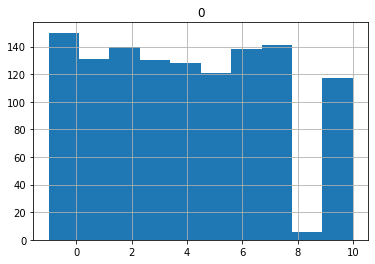

In [27]:
# Recluster the Data to the desired Linkage Method
cluster_labels=clusterer.labels_
y_pred= clusterer.labels_.tolist()
pd.DataFrame(y_pred).hist()

In [ ]:
# Recluster the Data to the desired Linkage Method
linkage_matrix = linkage(dist_matrix, method='single', metric='euclidean', optimal_ordering=True)
cluster_labels = fcluster(linkage_matrix, len(WBasins), criterion='maxclust')
y_pred=cluster_labels.tolist()
pd.DataFrame(y_pred).hist()

In [28]:
len(WBasins)

9

In [29]:
print('Wells: ',len(y_pred))
print('Basins: ',len(WBasins))

Wells:  1202
Basins:  9


In [ ]:
Wells.hvplot(responsive=True, min_width=10,min_height=500, legend=False)   # Plot All Wells

In [31]:
#State of Texas Shapefile (instead of Aquifers boundaries) for Both Datasets
stateFile = gpd.read_file(state)
stateFile=stateFile.to_crs("EPSG:4326")

In [32]:
#Aquifers Shapefile for Synthetic Data
shapFile = gpd.read_file(shpath)
shapFileFiltered=shapFile.to_crs("EPSG:4326")

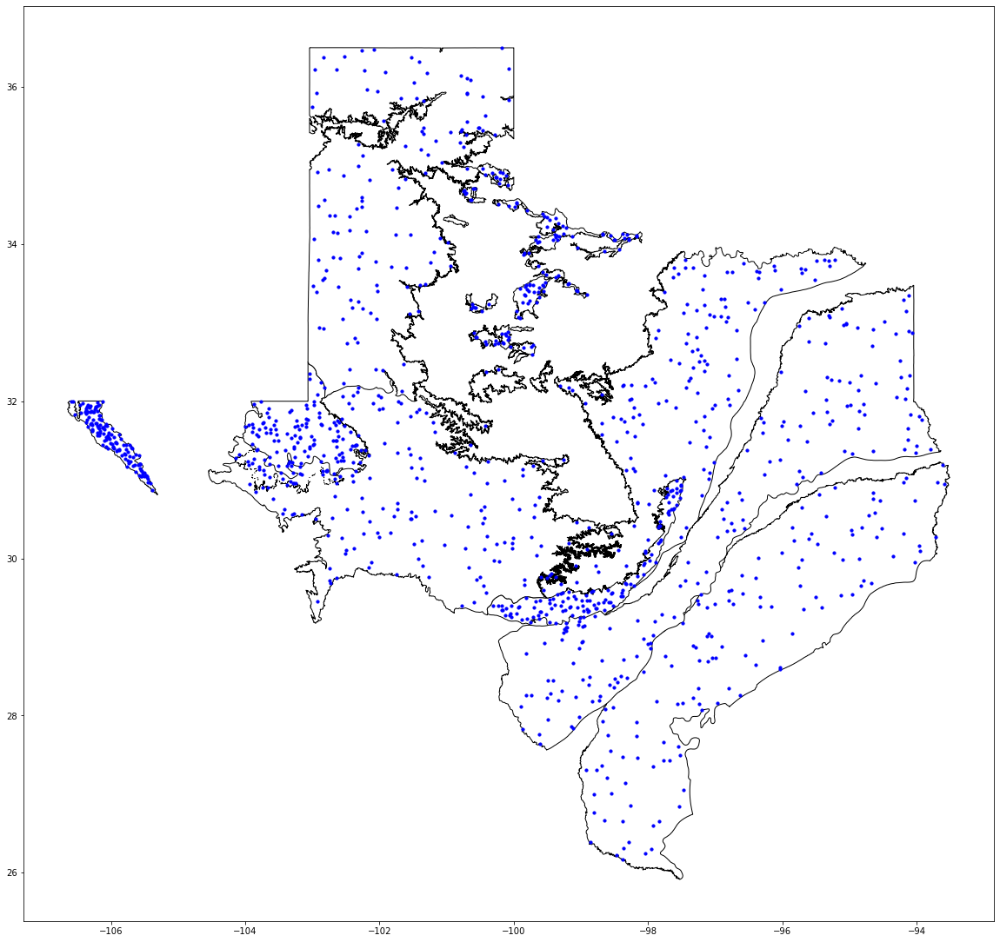

In [60]:
#Points for GroundTruth
#Convert the Points into Geometery file compatible with GeoPandas, then assign it correct coordinated and reproject it to similar projection to the shapefile (Basins)
gdf = gpd.GeoDataFrame(latlong, geometry=gpd.points_from_xy(latlong.LONGITUDE, latlong.LATITUDE, crs="EPSG:4326"))

base = shapFileFiltered.plot(color='white',  figsize=(20,25),edgecolor='black')
WellsMap=gdf.plot(ax=base, marker='o', color='blue', markersize=10);

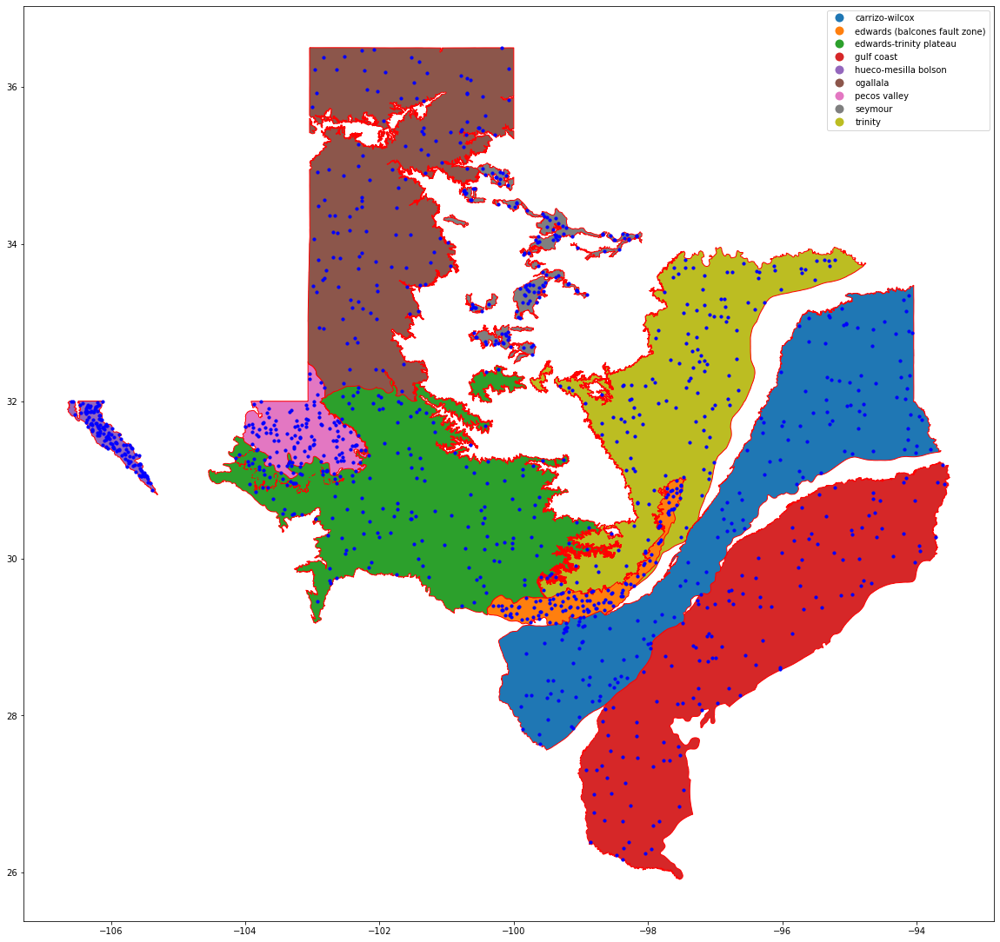

In [61]:
#Points for GroundTruth
#Convert the Points into Geometery file compatible with GeoPandas, then assign it correct coordinated and reproject it to similar projection to the shapefile (Basins)
gdf = gpd.GeoDataFrame(latlong, geometry=gpd.points_from_xy(latlong.LONGITUDE, latlong.LATITUDE, crs="EPSG:4326"))

# Create a categorical colormap for the unique values in 'AQ_NAME' column
cmap = plt.get_cmap('tab20c', len(shapFileFiltered['AQ_NAME'].unique()))

colors = {0: '#1f77b4', 1: '#ff7f0e', 2: '#2ca02c', 3: '#d62728', 4: '#9467bd', 5: '#8c564b', 6: '#e377c2', 7: '#7f7f7f', 8: '#bcbd22'}
# ColorCode = {'#1f77b4': 'blue', '#ff7f0e': 'orange', '#2ca02c': 'green', '#d62728': 'red', '#9467bd': 'purple', '#8c564b': 'brown', '#e377c2': 'pink', '#7f7f7f': 'gray', '#bcbd22': 'yellow-green'}

# Create a custom colormap from the custom colors
cmap = ListedColormap([colors[idx] for idx in range(len(colors))])

# Plot the regions with ONE colors (White) as the background with red boundaries
# base = shapFileFiltered.plot(color='white',  figsize=(20, 20), edgecolor='red')

# Plot the regions with different colors based on the 'AQ_NAME' column
base = shapFileFiltered.plot(column='AQ_NAME', cmap=cmap, legend=True, figsize=(20, 20), edgecolor='red')

WellsMap=gdf.plot(ax=base, marker='o', color='blue', markersize=10);


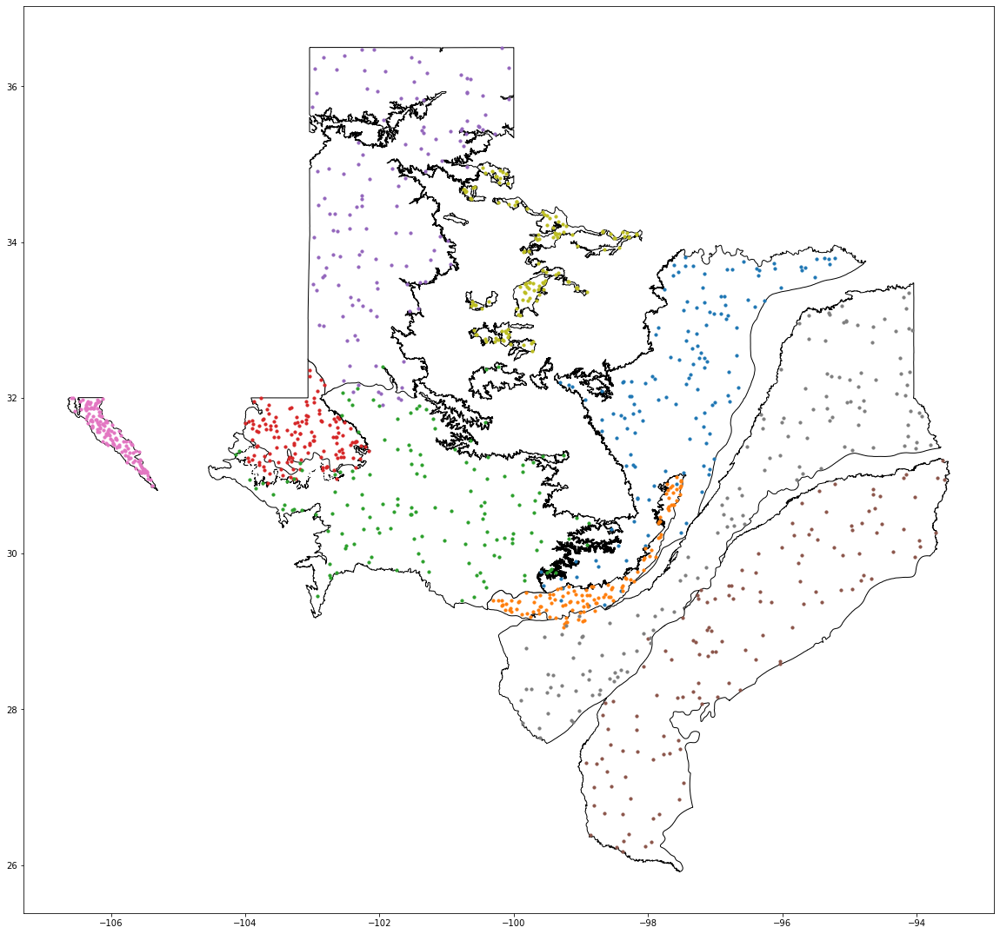

In [62]:
#Points for GroundTruth
#Convert the Points into Geometery file compatible with GeoPandas, then assign it correct coordinated and reproject it to similar projection to the shapefile (Basins)
gdf = gpd.GeoDataFrame(latlong, geometry=gpd.points_from_xy(latlong.LONGITUDE, latlong.LATITUDE, crs="EPSG:4326"))



colors = {0: '#1f77b4', 1: '#bcbd22', 2: '#d62728', 3: '#9467bd', 4:'#8c564b' , 5:'#e377c2' , 6: '#2ca02c',7: '#ff7f0e' , 8: '#7f7f7f'}
# ColorCode = {'#1f77b4': 'blue', '#ff7f0e': 'orange', '#2ca02c': 'green', '#d62728': 'red', '#9467bd': 'purple', '#8c564b': 'brown', '#e377c2': 'pink', '#7f7f7f': 'gray', '#bcbd22': 'yellow-green'}
cmap = ListedColormap(list(colors.values()))
point_colors = gdf['BASIN_NAME'].map(colors)


base = shapFileFiltered.plot(color='white',  figsize=(20, 25), edgecolor='black')

# Group the points by 'BASIN_NAME' and plot them separately
for basin_name, group in gdf.groupby('BASIN_NAME'):
    # Filter the points for the current 'BASIN_NAME'
    basin_points = group.geometry
    # Plot the points (data points) for the current 'BASIN_NAME' and color them based on the region color
    WellsMap = basin_points.plot(ax=base, marker='o', color=colors[int(basin_name)], markersize=10, label=basin_name)


In [ ]:
# WellsMap.figure.savefig('SYNTHPointDistribution.png')

array([[<AxesSubplot:title={'center':'0'}>]], dtype=object)

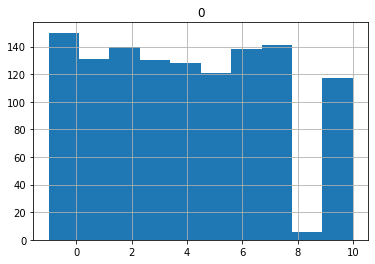

In [36]:
# Recluster the Data to the desired Linkage Method
# linkage_matrix = linkage(dist_matrix, method='centroid', metric='euclidean', optimal_ordering=True)
# cluster_labels = fcluster(linkage_matrix, len(WBasins), criterion='maxclust')
# y_pred=cluster_labels.tolist()

clusterer = hdbscan.HDBSCAN(metric='precomputed')
clusterer.fit(distance_matrix)
cluster_labels=clusterer.labels_
y_pred= clusterer.labels_.tolist()

pd.DataFrame(y_pred).hist()

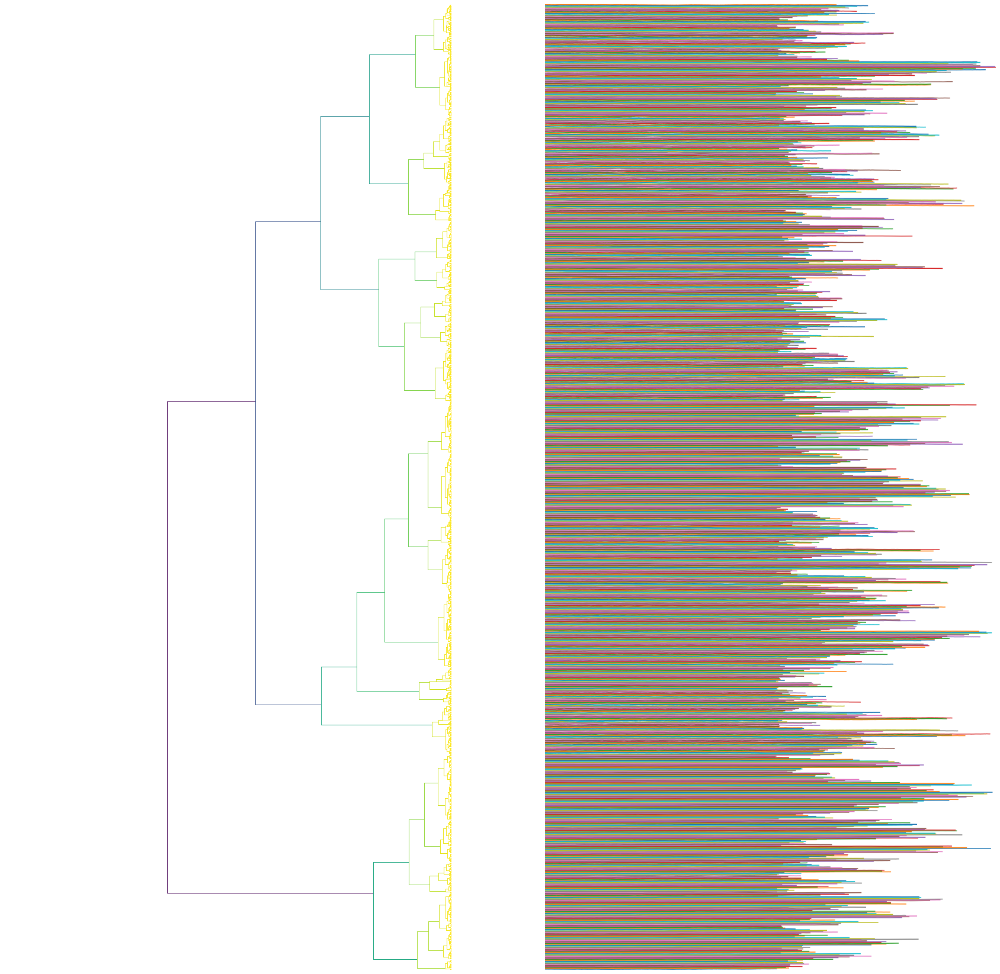

In [59]:
#Visualization
dendro=dendoTree()
temp=dendro.plot()
temp[0].set_size_inches(30,30)

In [ ]:
# temp[0].figure.savefig('test400.png')

X:  1202
y:  1202
X:  1346
y:  1346


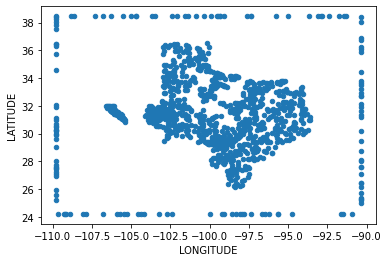

In [38]:
#Clustered (Optional) - Adds the Bazel Cluster to the Established Clusters
X=latlong[['LONGITUDE','LATITUDE']]
print('X: ',len(X))
y=copy.deepcopy(y_pred)
print('y: ',len(y))
X2,y2=bazel_cluster(X,y ,  extent=1, random_seed=42)
print('X: ',len(X2))
print('y: ',len(y2))
X2.plot(y='LATITUDE', x='LONGITUDE', kind='scatter')
X=X.to_numpy()
y=np.array(y)
X2=X2.to_numpy()
y2=np.array(y2)
# clf = SVC(C= 100, gamma= 30.0, random_state=42)
# clf.fit(X2, y2)
# print(clf.score(X2, y2))

0.997504159733777
CPU times: user 1.72 s, sys: 14.9 ms, total: 1.73 s
Wall time: 1.73 s


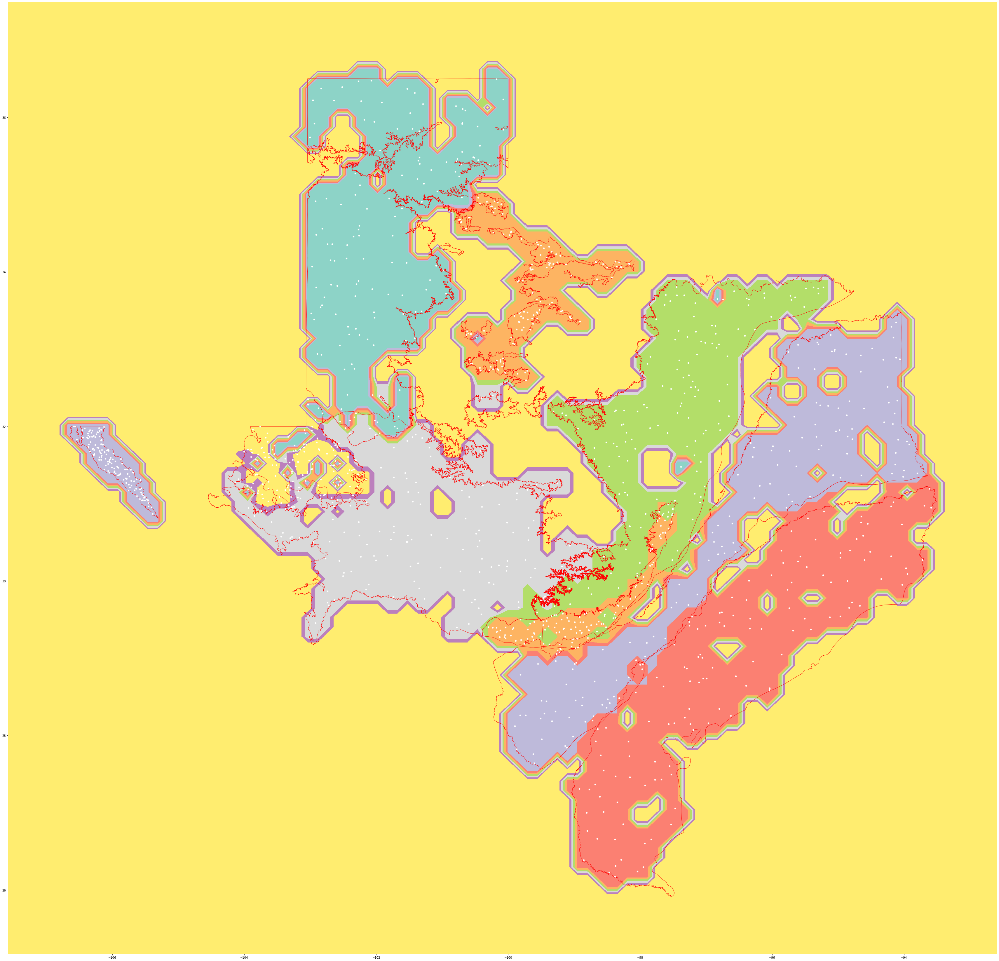

In [58]:
%%time

fig, ax = plt.subplots()
clf = SVC(C= 1000, gamma= 30.0)
clf.fit(X2, y2)
print(clf.score(X, y))
# clf.fit(X_train, y_train)
# print(clf.score(X_test, y_test))
cmap = mpl.colormaps['Set3']
disp = DecisionBoundaryDisplay.from_estimator(clf, X, response_method='predict', ax=ax ,grid_resolution=100, plot_method='contourf',cmap=cmap)
# stateFile.plot( color='none',  edgecolor='red', ax=ax) #Show Texas state boundaries instead of the aquifers boundaries
shapFileFiltered.plot( color='none',  edgecolor='red', ax=ax) #Show aquifers boundaries instead of the Texas state boundaries 
gdf.plot( marker='o',  color='white', markersize=20, ax=ax)
# test_points.plot(kind='scatter',marker='x', color='red', x=0, y=1, ax=ax)
disp.figure_.set_size_inches(100,60)
# disp.figure_

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

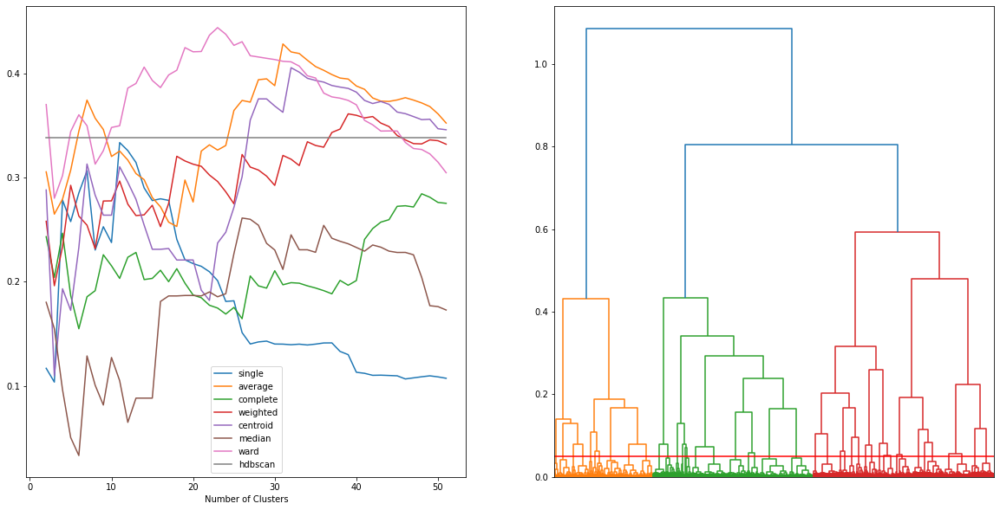

In [41]:
# Silhouette Score
columns=list(datagroup.groups.keys())
clusts=list(range(2,52))
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
clustNumb=pd.DataFrame()
for meth in tqdm_notebook(methods):
    temp=pd.DataFrame(columns=['Number of Clusters','Silhouette Score'])
    for cvi in tqdm_notebook(clusts, leave=False):
        if meth=='hdbscan':
            clusterer = hdbscan.HDBSCAN(metric='precomputed')
            clusterer.fit(distance_matrix)
            cluster_labels=clusterer.labels_
            y_pred= clusterer.labels_.tolist()
        else:
            linkage_matrix = linkage(dist_matrix, method=meth, metric='euclidean')
            cluster_labels = fcluster(linkage_matrix, cvi, criterion='maxclust')
            y_pred=cluster_labels.tolist()
        tempSill=pd.DataFrame({'Number of Clusters':[cvi],'Silhouette Score': [metrics.silhouette_score(distance_matrix, y_pred, metric='precomputed')]})
        temp=pd.concat((temp, tempSill), axis=0)
    temp['Number of Clusters'] = temp['Number of Clusters'].astype(int)
    temp.set_index('Number of Clusters', inplace= True)
    ClustPlot1 = temp.plot(y='Silhouette Score', label = meth, ax=axes[0])
    clustNumb.loc[:,meth]=temp[['Silhouette Score']]
# plt.yscale("log")                                                #show the Hiararchical Tree on Log y-axis
ClustPlot2 = dendrogram(linkage_matrix, no_labels=True, ax=axes[1])
plt.axhline(np.mean(dist_matrix), color='r') # horizontal
# clustNumb

In [42]:
clustNumb

,single,average,complete,weighted,centroid,median,ward,hdbscan
Number of Clusters,,,,,,,,
2,0.116816,0.305631,0.243297,0.258098,0.288227,0.180274,0.370347,0.338135
3,0.103549,0.264995,0.2041,0.196164,0.10971,0.154916,0.280277,0.338135
4,0.278435,0.279388,0.246696,0.233594,0.193264,0.096318,0.302007,0.338135
5,0.257822,0.307179,0.18686,0.292708,0.172485,0.050238,0.344371,0.338135
6,0.28534,0.344758,0.154794,0.263112,0.232899,0.032946,0.360522,0.338135
7,0.30656,0.374633,0.18554,0.25438,0.313179,0.128689,0.349945,0.338135
8,0.230483,0.357183,0.191395,0.231744,0.283185,0.100538,0.313083,0.338135
9,0.252871,0.346409,0.225951,0.277607,0.264019,0.081507,0.325969,0.338135
10,0.237697,0.320412,0.215323,0.277743,0.264019,0.127178,0.34829,0.338135


In [43]:
print('Labeled Data Cluster Number: ',len(WBasins))
print('Silhouette Score for the Labeled Data Cluster Number: ',clustNumb.loc[len(WBasins)][0])

Labeled Data Cluster Number:  9
Silhouette Score for the Labeled Data Cluster Number:  0.2528706865149751


In [57]:
%%time
# Compliation Drawing - Choose in the two variables below the methods to include in the compilation and the Number of Clusters to test

clustmethods= ['hdbscan']
Clusters=[9]

# clustmethods= ['single','average','complete','hdbscan', 'weighted','centroid','median','ward']
# Clusters=[7,8,9,10,11,12,13,14,15]


fig, axes = plt.subplots(nrows=len(Clusters), ncols=len(clustmethods), figsize=(100,100))
#Finding the Most suitable Number of Expected Clusters
for meth in clustmethods:
    for clust in Clusters:
        Cluster_Number=clust

        if meth=='hdbscan':
            clusterer = hdbscan.HDBSCAN(metric='precomputed')
            clusterer.fit(distance_matrix)
            cluster_labels=clusterer.labels_
            y_pred= clusterer.labels_.tolist()
        else:
            linkage_matrix = linkage(dist_matrix, method=meth, metric='euclidean')
            cluster_labels = fcluster(linkage_matrix, clust, criterion='maxclust')
            y_pred=cluster_labels.tolist()
#         acc=np.round(adjusted_rand_score(labels, y_pred),4)
        acc='NA'
#         print(f'{meth} Model Accuracy(ARI): ', acc)
        print(f'{meth} Linkage Method with {clust} Clusters')
    
        z=clustmethods.index(meth)
        i=Clusters.index(clust)

        #Clustered
        X=latlong[['LONGITUDE','LATITUDE']]
        print('X: ',len(X))
        y=copy.deepcopy(y_pred)
        print('y: ',len(y))
        X2,y2=bazel_cluster(X,y, extent=2, random_seed=42)
        print('X2: ',len(X2))
        print('y2: ',len(y2))
        X=X.to_numpy()
        y=np.array(y)
        X2=X2.to_numpy()
        y2=np.array(y2)

        gamma=30
        clf = SVC(C= 1000, gamma= gamma, random_state=42)
        clf.fit(X2, y2)
        print('Drawing Accuracy: ',clf.score(X, y), '\n\n')
        # clf.fit(X_train, y_train)
        # print(clf.score(X_test, y_test))

        if len(Clusters)==1 and len(clustmethods)==1:
            axes.set_title(f'{meth} Linkage Method with {clust} Clusters',fontsize = 60, fontweight ="bold")
#             shapFileFiltered.plot( color='none', edgecolor='red', ax=axes)
            stateFile.plot( color='none',  edgecolor='red',linewidth=2,  ax=axes) #Show Texas state boundaries instead of the aquifers boundaries
            disp=plot_decision_regions(X, y, clf=clf, legend=0, ax=axes, colors='#1f77b4,#ff7f0e,#3ca02c,#d62728,#9467bd,#8c564b,#e377c2,#7f7f7f,#bcbd22,#17becf,#CFD6EA,#F4EDED,#EF6F6C,#F865B0,#6874E8,#50723C', cluster='ray')
        elif len(Clusters)==1:
            axes[z].set_title(f'{meth} Linkage Method with {clust} Clusters',fontsize = 60, fontweight ="bold") 
            shapFileFiltered.plot( color='none', edgecolor='red', ax=axes[z])
            disp=plot_decision_regions(X2, y2, clf=clf, legend=0, ax=axes[z], cluster='ray')
        else:
            axes[i][z].set_title(f'{meth} Linkage Method with {clust} Clusters',fontsize = 60, fontweight ="bold") 
            shapFileFiltered.plot( color='none', edgecolor='red', ax=axes[i][z])
            disp=plot_decision_regions(X2, y2, clf=clf, legend=0, ax=axes[i][z], cluster='ray')
        

#         disp = DecisionBoundaryDisplay.from_estimator(clf, X, response_method='predict', ax=axes[i][z] ,grid_resolution=100, plot_method='contourf', cmap=cmap)
#         shapFileFiltered.plot( color='none',  edgecolor='red', ax=axes[i][z])
#         gdf.plot( marker='o',  color='blue', markersize=50, ax=axes[i][z])
        # test_points.plot(kind='scatter',marker='x', color='red', x=0, y=1, ax=axes[i][z])
#         disp.figure_.set_size_inches(100,100)
#         drawpath=pathlib.Path(mydir3,f'{meth}-C{clust}-({acc}).png')
#         disp.figure_.savefig(drawpath)
        # disp.figure_
    
drawpath=pathlib.Path(mydir3,f'Compilation-({str(parameters[-1][0])}-{str(parameters[-1][1])}-{str(parameters[-1][2])}-{str(parameters[-1][4])}-gamma{str(gamma)}).png')
fig.tight_layout()
# fig.savefig(drawpath)

hdbscan Linkage Method with 9 Clusters
X:  1202
y:  1202
X2:  1346
y2:  1346
Drawing Accuracy:  0.997504159733777 




/home/200734761/temp/ipykernel_75029/122155070.py:326: UserWarning:

You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.



CPU times: user 14.7 s, sys: 1.13 s, total: 15.8 s
Wall time: 3min 21s


In [45]:
from collections import Counter

def count_occurrences(lst):
    return Counter(lst)

y.sort()

# Count occurrences of each unique value in the list
occurrences = count_occurrences(y)
occurrences2 = count_occurrences(y2)
# Convert the Counter object to a pandas Series
series_occurrences = pd.Series(occurrences)
series_occurrences2 = pd.Series(occurrences2)
# Convert the Series to a DataFrame
df_occurrences = pd.DataFrame({'Count y': series_occurrences})
df_occurrences2 = pd.DataFrame({'Count y2': series_occurrences2})
AQ_Occurance=pd.concat((df_occurrences, df_occurrences2), axis=1)
AQ_Occurance

,Count y,Count y2
-1,21.0,21
0,129.0,129
1,131.0,131
2,140.0,140
3,130.0,130
4,128.0,128
5,121.0,121
6,138.0,138
7,141.0,141
8,6.0,6


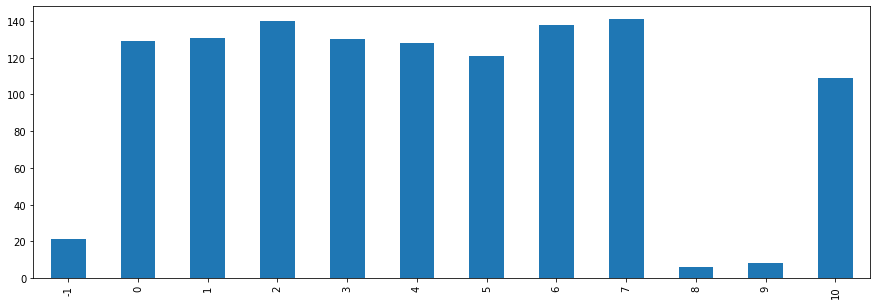

In [46]:
plott=series_occurrences.plot(kind='bar',figsize=(15,5))
plott.figure.savefig('626 - Clusters')

In [47]:
# Creates an Index for the GroundTruth Basins and the Wells Contained within
SWellD=pd.DataFrame(Wells,columns=Wells.columns,index=Wells.index)
WellsDic={}
for x in WBasins:
    for z in x[1].index:
        if x[0] in WellsDic:
            WellsDic[x[0]].append(z)
        else:
            WellsDic.update({x[0]:[z]})
NWellsDic={}
for basin in WellsDic:
    NWellsDic.update({basin:SWellD[WellsDic[basin]]})
    
counts=WBasins.count()
counts=counts[counts>=1]
counts.dropna(inplace=True)
counts.sort_values('LATITUDE', axis=0,ascending=True)

,LONGITUDE,LATITUDE
BASIN_NAME,,
7,123,123
1,129,129
3,129,129
4,130,130
5,131,131
2,139,139
0,140,140
8,140,140
6,141,141


In [48]:
Puritys[methods.index('hdbscan')]

,Basin,MostProbableCluster,NumberOfWellsinBasin,CorrectlyPredictedWells,NumberOfWellsinCluster,PredictionAccuracy
0,0,Cluster 6,140,138,138,0.985714
0,1,Cluster 4,129,128,128,0.992248
0,2,Cluster 10,139,109,109,0.784173
0,3,Cluster 0,129,129,129,1.000000
0,4,Cluster 3,130,130,130,1.000000
0,5,Cluster 1,131,131,131,1.000000
0,6,Cluster 7,141,141,141,1.000000
0,7,Cluster 5,123,121,121,0.983740
0,8,Cluster 2,140,140,140,1.000000


In [ ]:
# Draw GroundTruth Basins and Wells contained within
basinName='0' # Upper Lower Mojave River Valley, Owens Valley, Coastal Plain Of Orange County	
Num=WBasins.get_group(basinName).count()[0]
NWellsDic[basinName].hvplot(title=str('Basin Name: '+str(basinName)+ ', Number of Wells: '+str(Num)), responsive=True, min_width=10,min_height=500, legend=False)

In [49]:
# Creates an Index for the Classified Basins and the Wells Contained within
indx=[]
for well in datagroup.groups:
    indx.append(well)
indx=pd.DataFrame(indx, columns=['WellCode'])
indx['Number of Basins']=y_pred
indx=indx.set_index('WellCode')
indx=indx.groupby('Number of Basins')
Wells=pd.pivot_table(dataCleanMonthlyR, index = 'Date', columns = 'WellCode', values = 'GWL') #Original
SWellD=pd.DataFrame(Wells,columns=Wells.columns,index=Wells.index)
WellsDic={}
for x in indx:
    for z in x[1].index:
        if x[0] in WellsDic:
            WellsDic[x[0]].append(z)
        else:
            WellsDic.update({x[0]:[z]})
NWellsDic2={}
for basin in WellsDic:
    NWellsDic2.update({basin:SWellD[WellsDic[basin]]})
BasinNumbers=pd.DataFrame({'Number of Basins':indx.size().index,'Number of Wells':indx.size().values}).set_index('Number of Basins')
BasinNumbers

,Number of Wells
Number of Basins,
-1,21
0,129
1,131
2,140
3,130
4,128
5,121
6,138
7,141


In [51]:
Puritys[7]

,Basin,MostProbableCluster,NumberOfWellsinBasin,CorrectlyPredictedWells,NumberOfWellsinCluster,PredictionAccuracy
0,0,Cluster 6,140,138,138,0.985714
0,1,Cluster 4,129,128,128,0.992248
0,2,Cluster 10,139,109,109,0.784173
0,3,Cluster 0,129,129,129,1.000000
0,4,Cluster 3,130,130,130,1.000000
0,5,Cluster 1,131,131,131,1.000000
0,6,Cluster 7,141,141,141,1.000000
0,7,Cluster 5,123,121,121,0.983740
0,8,Cluster 2,140,140,140,1.000000


In [ ]:
# Draw Predicted Basins and Wells predicted to be contained within
basinName=6                                 # Write the Cluster number to compare it with the Basin Number
Num=indx.get_group(basinName).count()[0]
NWellsDic2[basinName].hvplot(title=str('Basin Name: '+str(basinName)+ ', Number of Wells: '+str(Num)), responsive=True, min_width=10,min_height=500, legend=False)

The Wells included are:  ['1748', '2186', '2281', '2292', '2398', '2443', '2459', '2461', '2515', '2552', '2837', '2849', '2869', '2893', '2896', '2949', '2973', '3097', '3109', '3180', '3437', '3489', '3661', '3919', '3995', '642', '666', '701', '702', '833', '900']


array([[<AxesSubplot:title={'center':'GWL'}>]], dtype=object)

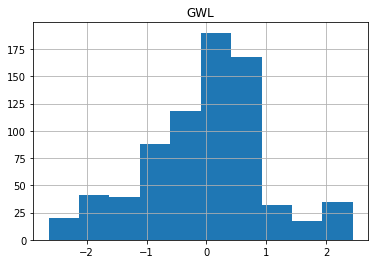

In [53]:
# Check the Normal Distribution of the Wells Classified by the Nomality Tests as Normal
print('The Wells included are: ',overview.loc['D’Agostino']['Wells Names'])
datagroup.get_group('2461').hist()